In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
from os.path import join
import torch
import matplotlib.pyplot as plt
sys.path.append("/n/holylabs/LABS/sompolinsky_lab/Everyone/xupan/DiffusionObjectRelation/PixArt-alpha")
from diffusion.utils.misc import read_config, set_random_seed, \
    init_random_seed, DebugUnderflowOverflow
sys.path.append("/n/holylabs/LABS/sompolinsky_lab/Everyone/xupan/DiffusionObjectRelation")
from utils.pixart_sampling_utils import visualize_prompts, PixArtAlphaPipeline_custom, \
    load_embed_and_mask, visualize_prompts_with_traj
from utils.pixart_utils import construct_diffuser_pipeline_from_config, construct_pixart_transformer_from_config, state_dict_convert
from utils.attention_map_store_utils import replace_attn_processor, AttnProcessor2_0_Store, PixArtAttentionVisualizer_Store

ModuleNotFoundError: No module named 'diffusion'

### Load models and tokenizer

In [2]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot"
ckptdir = join(savedir, "checkpoints")
config = read_config(join(savedir, 'config.py'))
weight_dtype = torch.float32
if config.mixed_precision == "fp16": # accelerator.
    weight_dtype = torch.float16
elif config.mixed_precision == "bf16": # accelerator.
    weight_dtype = torch.bfloat16
    
pipeline = construct_diffuser_pipeline_from_config(config, pipeline_class=PixArtAlphaPipeline_custom)
ckpt = torch.load(join(ckptdir, "epoch_4000_step_160000.pth"))
pipeline.transformer.load_state_dict(state_dict_convert(ckpt['state_dict_ema']))
pipeline = pipeline.to("cuda")
pipeline.set_progress_bar_config(disable=True)

validation_prompts = config.validation_prompts
prompt_cache_dir = config.prompt_cache_dir

from transformers import T5Tokenizer, T5EncoderModel

T5_path = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/output/pretrained_models/t5_ckpts/t5-v1_1-xxl"
tokenizer = T5Tokenizer.from_pretrained(T5_path, )#subfolder="tokenizer")

pipeline.transformer = replace_attn_processor(pipeline.transformer)
attnvis_store = PixArtAttentionVisualizer_Store(pipeline)
attnvis_store.setup_hooks()

attnvis_store.clear_activation()
image_logs_sel, latents_traj_sel, pred_traj_sel, t_traj_sel = visualize_prompts_with_traj(\
    pipeline, validation_prompts[7:8], prompt_cache_dir, config.model_max_length, weight_dtype)

embed_infos = load_embed_and_mask(validation_prompts[7:8], prompt_cache_dir, config.model_max_length, device="cuda")

print(embed_infos[0]['prompt'])
prompt = embed_infos[0]['prompt']
# attention_mask_raw = embed_infos[0]['emb_mask'].cpu()
token_ids = tokenizer.encode(prompt)
word_tokens = tokenizer.convert_ids_to_tokens(token_ids)
word_tokens = [token.replace("▁", "") for token in word_tokens]

Loading pipeline components...: 100%|██████████| 3/3 [00:00<00:00, 24.22it/s]
You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
/n/holylabs/LABS/sompolinsky_lab/Users/xupan/envs/pixart/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Setting up hooks for PixArt attention modules:
- Block 0
- Block 1
- Block 2
- Block 3
- Block 4
- Block 5
- Block 6
- Block 7
- Block 8
- Block 9
- Block 10
- Block 11
torch.Size([50, 20, 4096])
torch.Size([50, 20])
red circle is to the left of blue square


In [15]:
config.prompt_cache_dir

'/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/output/objectRel_pilot_rndembposemb'

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
/n/holylabs/LABS/sompolinsky_lab/Users/xupan/envs/pixart/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


### Systematic storing attention maps across time steps

Setting up hooks for PixArt attention modules:
- Block 0
- Block 1
- Block 2
- Block 3
- Block 4
- Block 5
- Block 6
- Block 7
- Block 8
- Block 9
- Block 10
- Block 11


In [6]:
validation_prompts

['triangle is to the upper left of square',
 'blue triangle is to the upper left of red square',
 'triangle is above and to the right of square',
 'blue circle is above and to the right of blue square',
 'triangle is to the left of square',
 'triangle is to the left of triangle',
 'circle is below red square',
 'red circle is to the left of blue square',
 'blue square is to the right of red circle',
 'red circle is above square',
 'triangle is above red circle',
 'red is above blue',
 'red is to the left of red',
 'blue triangle is above red triangle',
 'blue circle is above blue square']

torch.Size([50, 20, 4096])
torch.Size([50, 20])
red circle is to the left of blue square


In [8]:
layer_i = 11 # note the 
timestep = -1
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
print(self_attn_map.shape, cross_attn_map.shape)

torch.Size([50, 12, 64, 64]) torch.Size([50, 12, 64, 20])


In [9]:
min_cross_attn_map = cross_attn_map.min().item()
max_cross_attn_map = cross_attn_map.max().item()
print(f"Minimum value in cross attention map: {min_cross_attn_map}")
print(f"Maximum value in cross attention map: {max_cross_attn_map}")


Minimum value in cross attention map: 0.0
Maximum value in cross attention map: 1.0


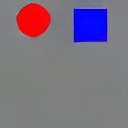

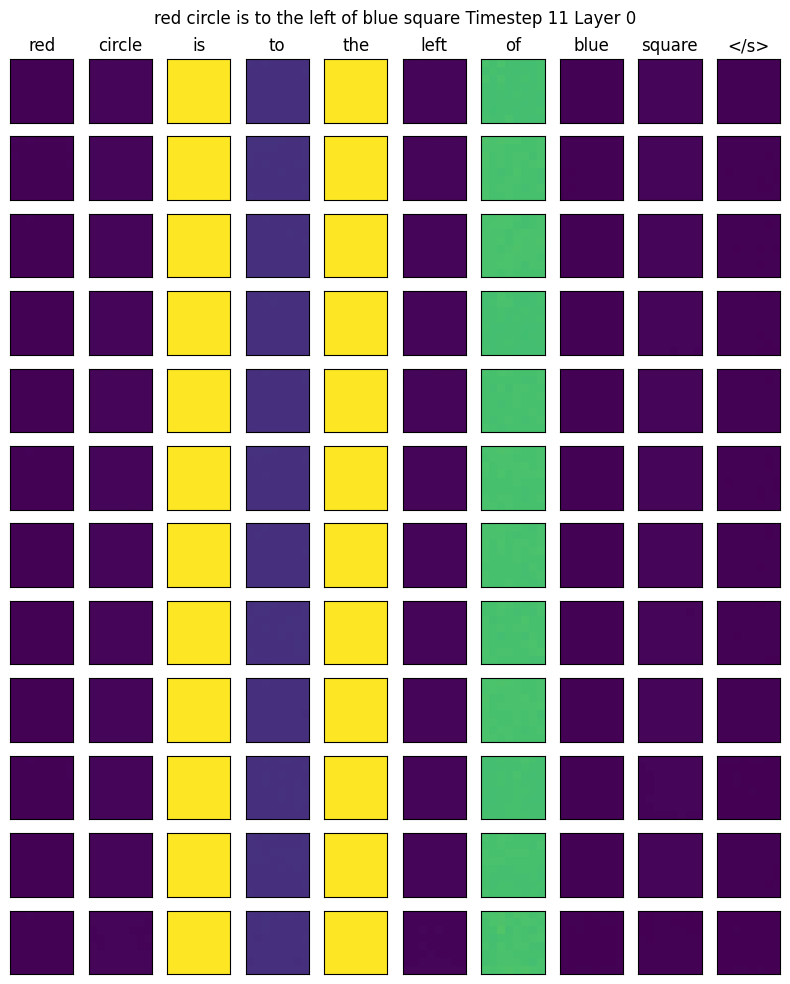

In [17]:
layer_i = 6 # note the 
timestep = 11
sample_id = 1
display(image_logs_sel[0]['images'][sample_id])
for layer_i in range(1):
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
    
    # display(image_logs_sel[0]['images'][sample_id])
    figh, axs = plt.subplots(12, len(word_tokens), figsize=(8, 10))
    for head_id in range(12):
        for token_id in range(len(word_tokens)):
            ax = axs[head_id, token_id]
            ax.imshow(cross_attn_map[25 + sample_id, 
                                    head_id, :, 
                                    token_id].view(8, 8).cpu().numpy(), vmin=0, vmax=0.2)
            ax.axis('image')
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            if head_id == 0:
                ax.set_title(f'{word_tokens[token_id]}')
                # ax.set_title(f'H{head_id}T{token_id} {word_tokens[token_id]}')
            
    plt.suptitle(f'{prompt} Timestep {timestep} Layer {layer_i}')
    plt.tight_layout()


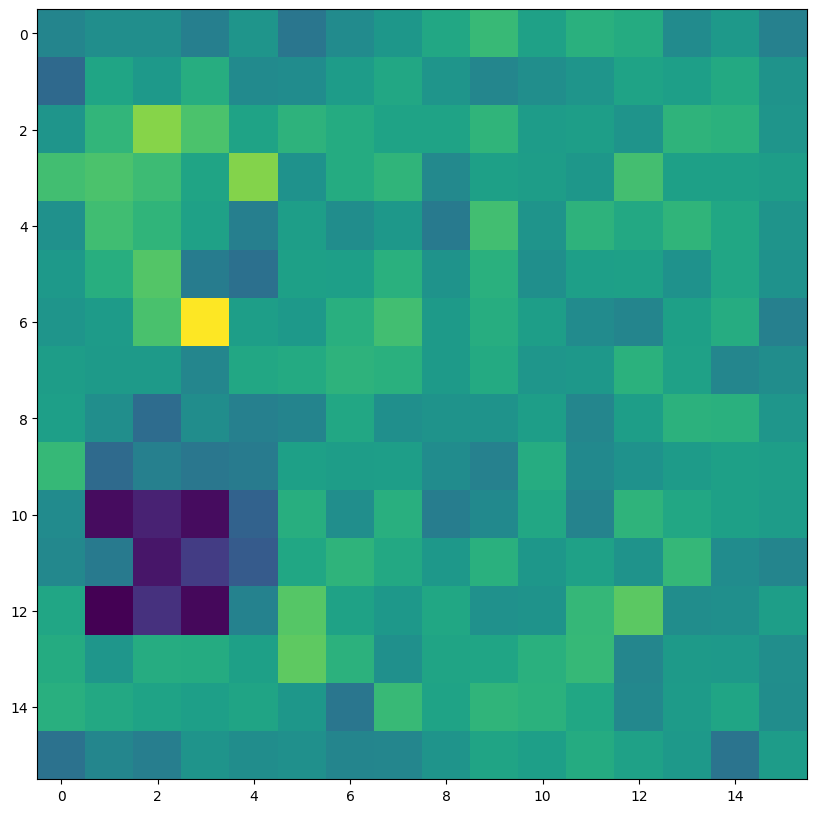

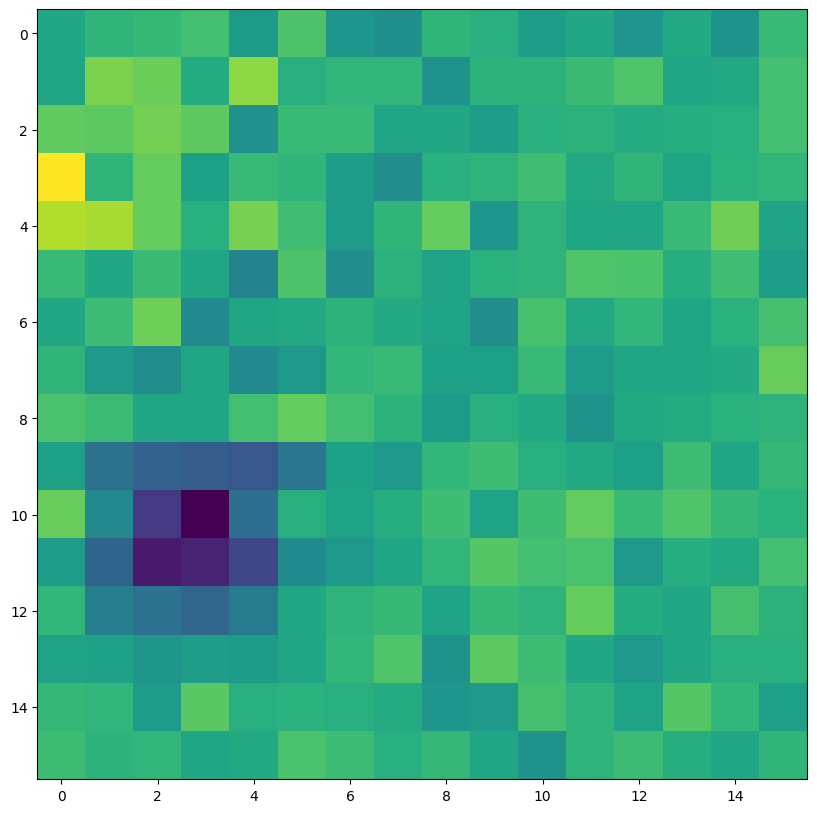

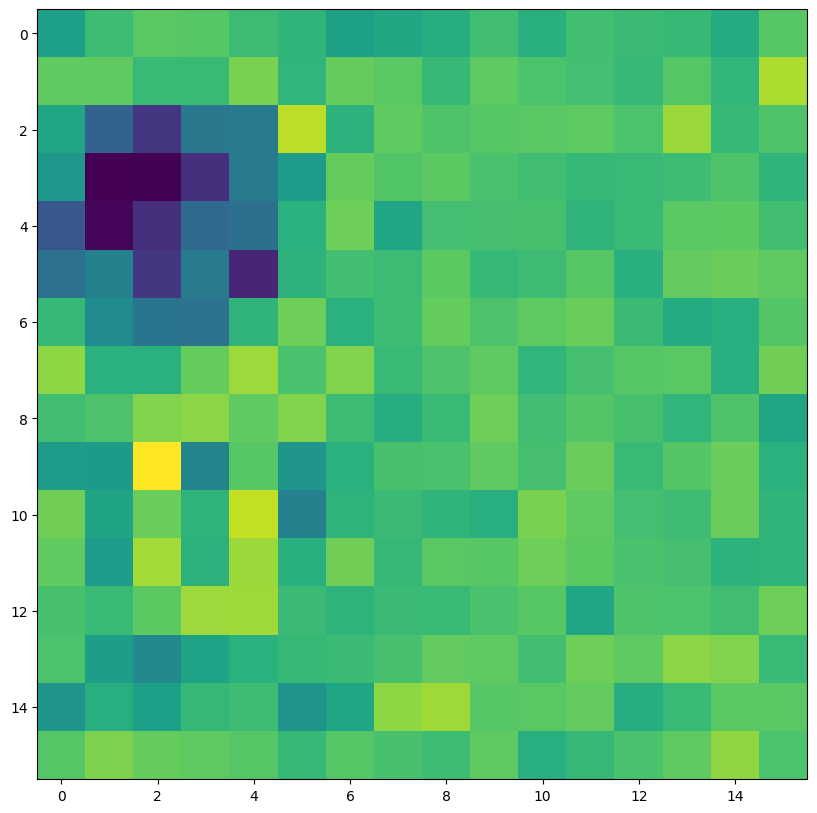

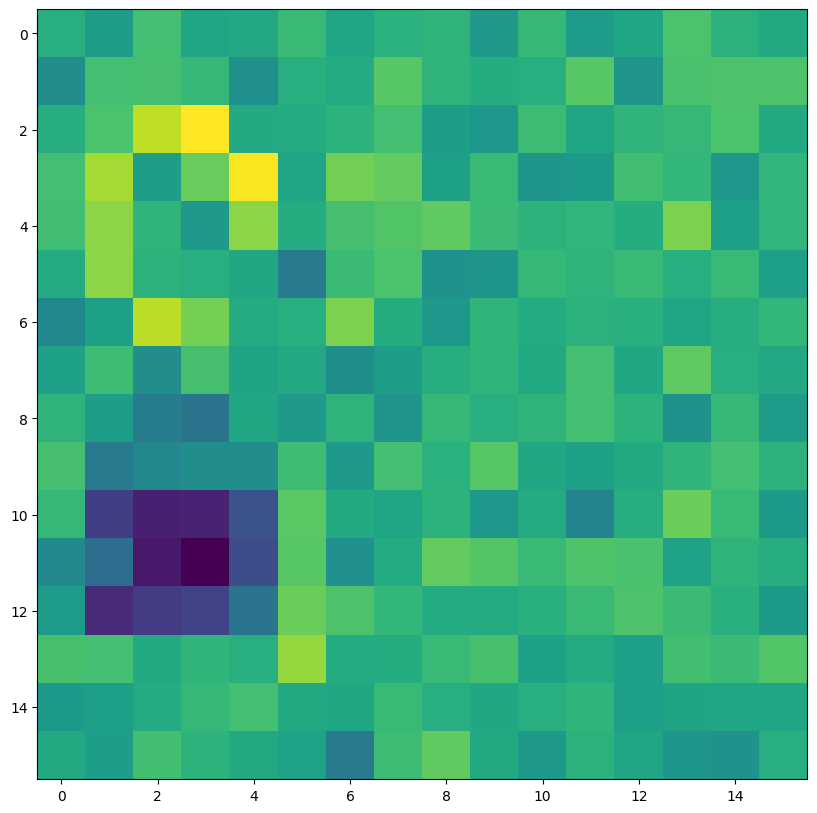

torch.Size([4, 16, 16])

In [48]:
import numpy as np
t = 12
for dim in range(4):
    plt.figure(figsize=(10, 10))
    plt.imshow(np.moveaxis(latents_traj_sel[0][t, sample_id, dim, :, :].cpu().numpy(), 0, -1))
    plt.show()
latents_traj_sel[0][t, sample_id, :, :, :].shape
# latents_traj_sel[0].shape

# image_logs_sel[0]['images'][sample_id]

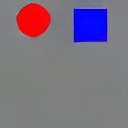

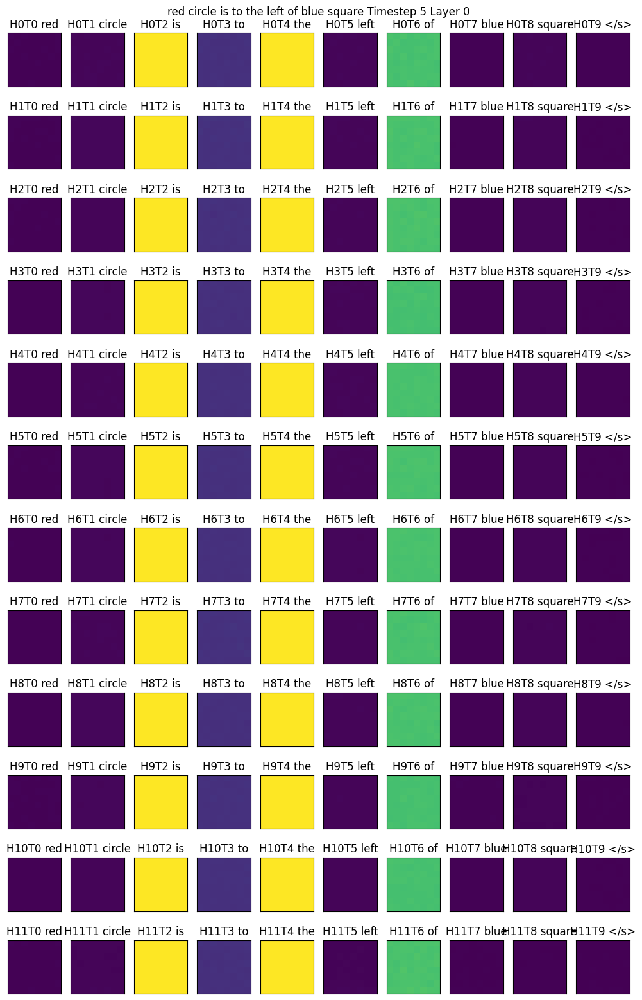

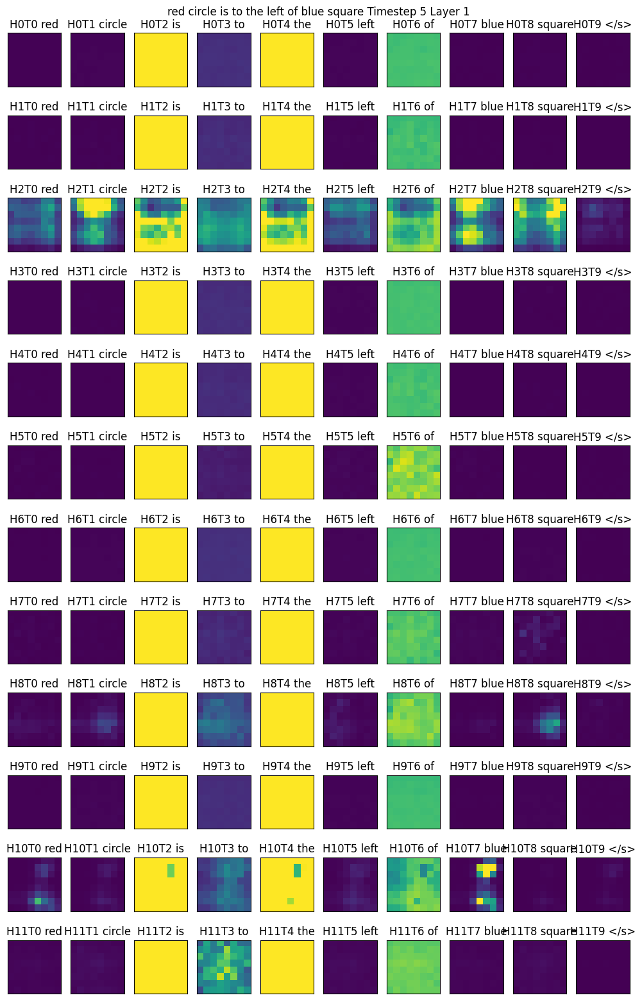

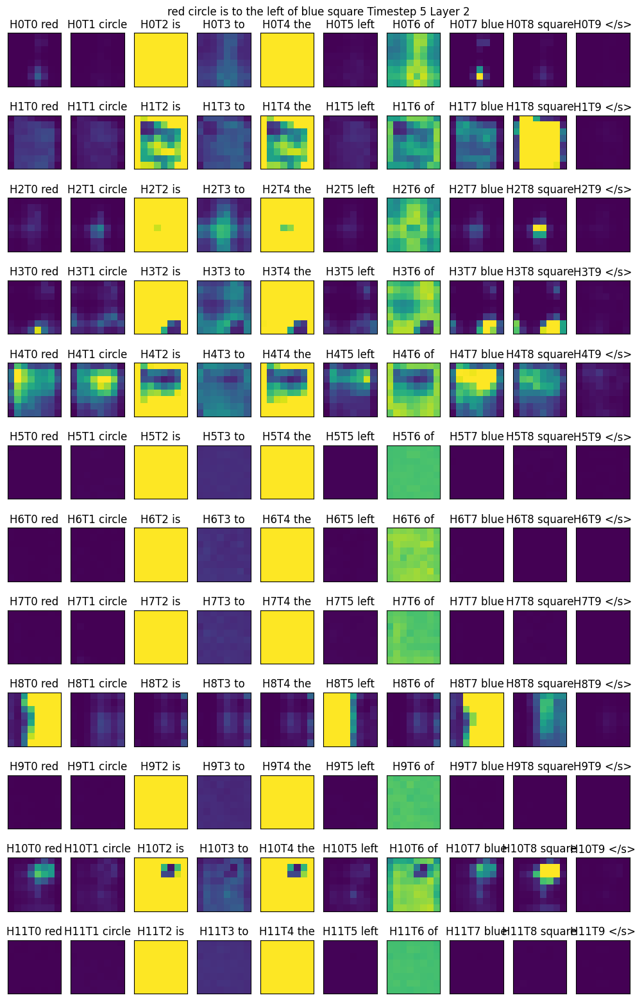

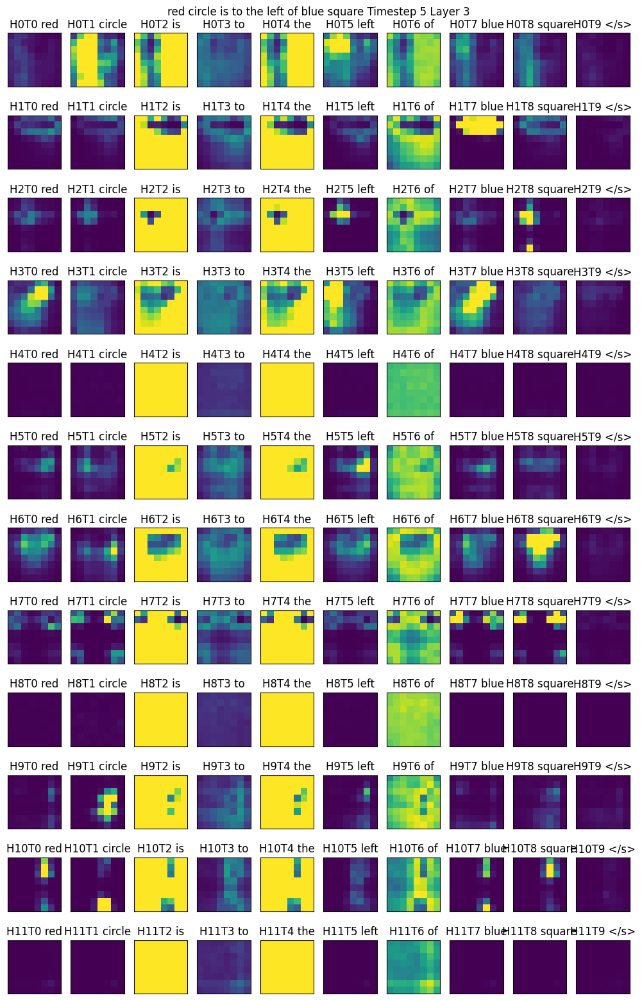

...

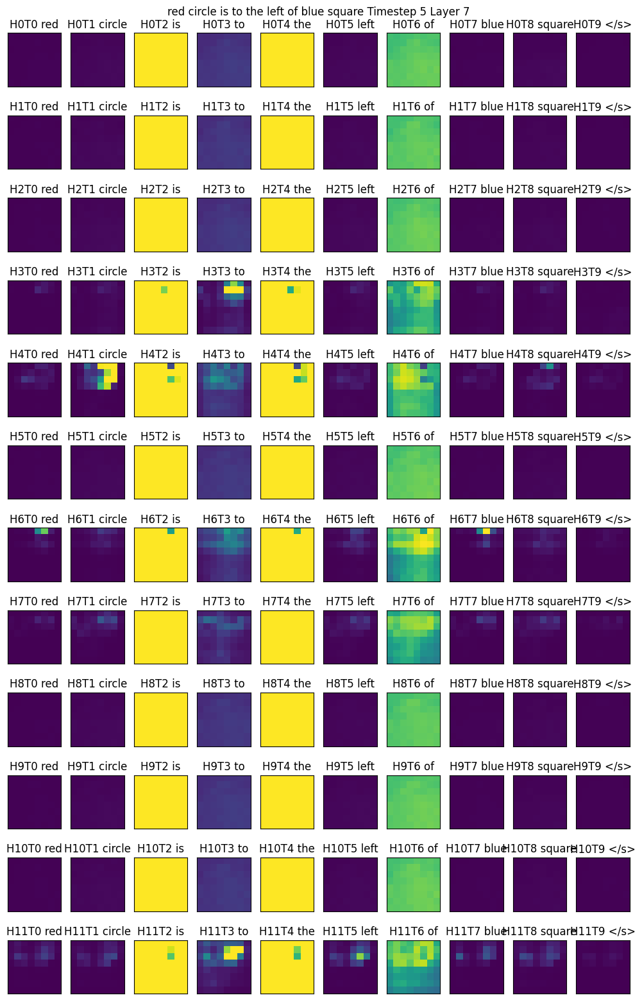

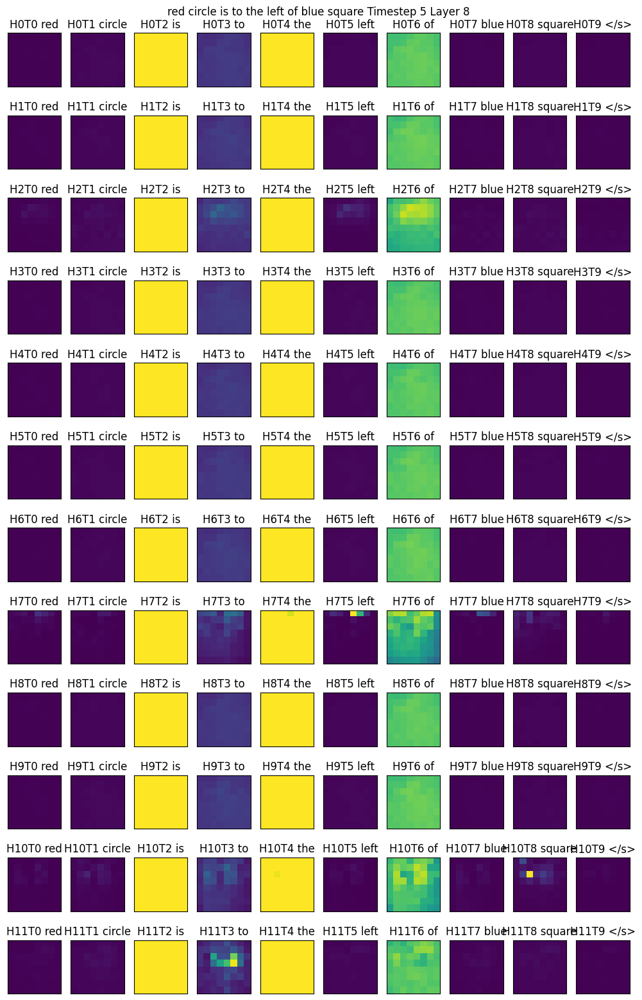

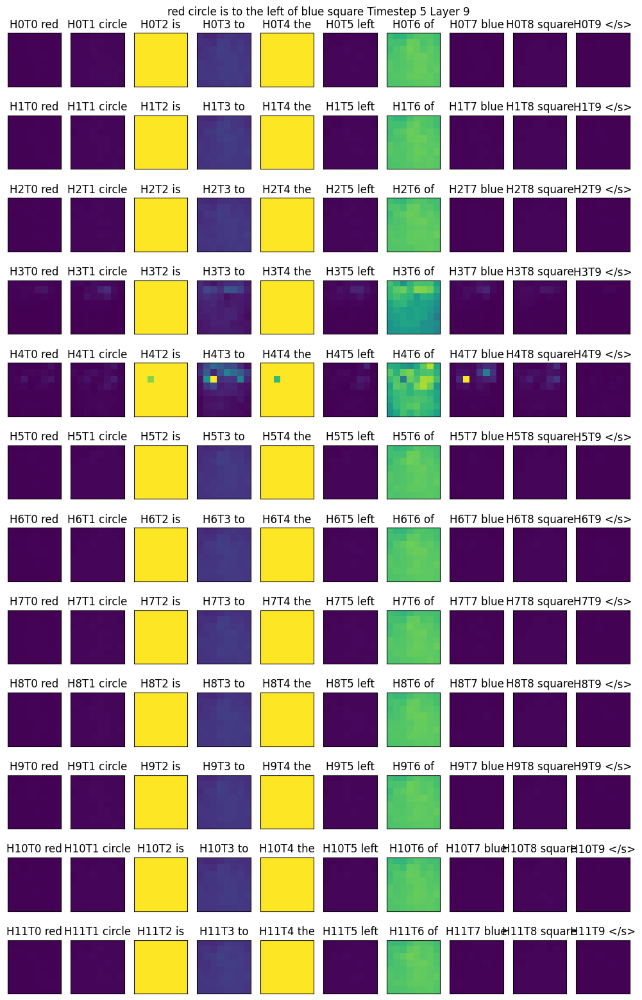

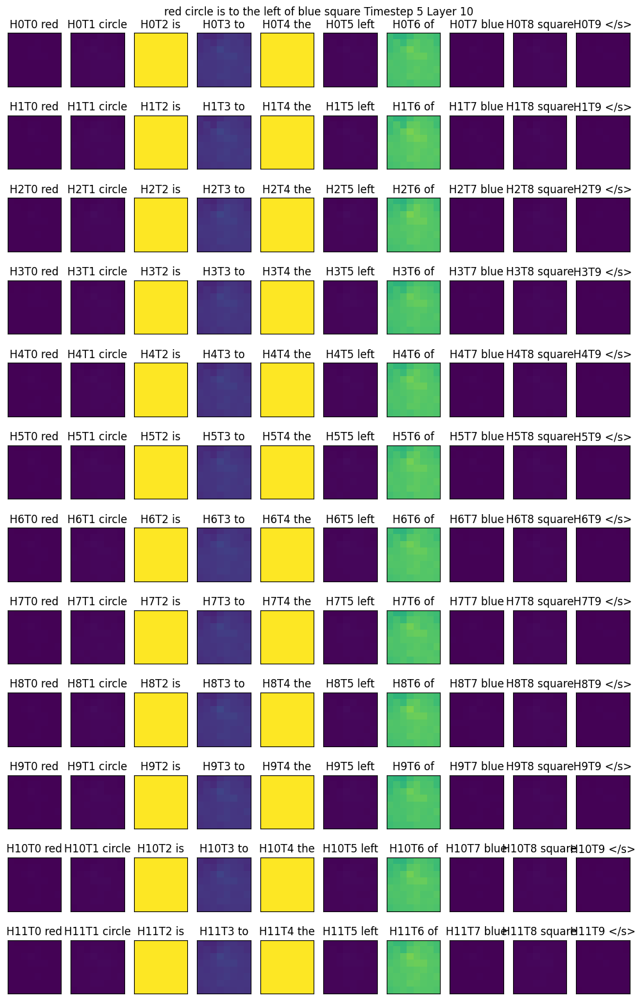

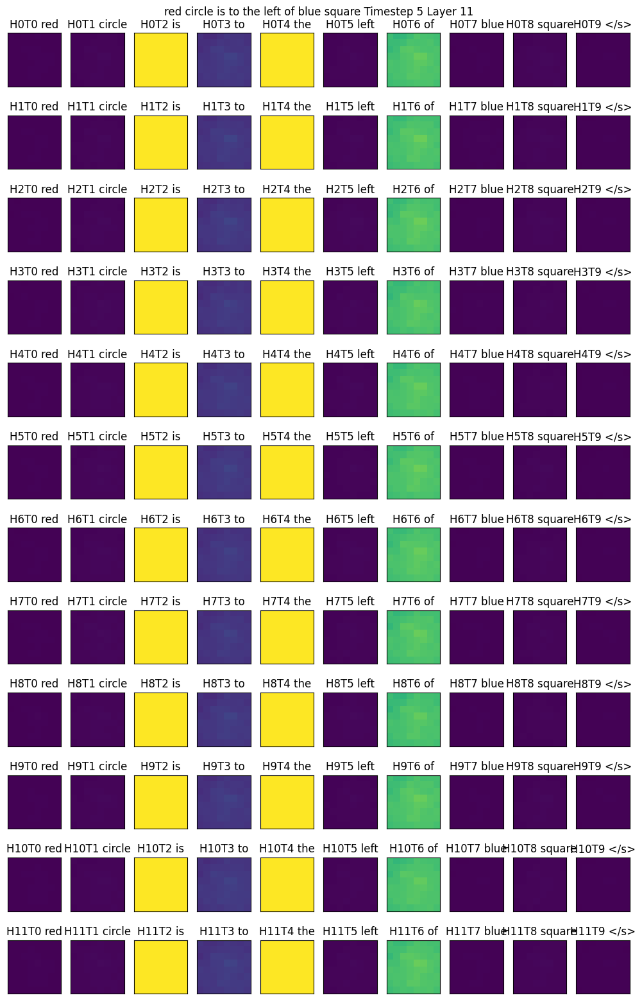

In [10]:
layer_i = 6 # note the 
timestep = 5
sample_id = 1
display(image_logs_sel[0]['images'][sample_id])
for layer_i in range(12):
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
    
    # display(image_logs_sel[0]['images'][sample_id])
    figh, axs = plt.subplots(12, len(word_tokens), figsize=(10, 16))
    for head_id in range(12):
        for token_id in range(len(word_tokens)):
            ax = axs[head_id, token_id]
            ax.imshow(cross_attn_map[25 + sample_id, 
                                    head_id, :, 
                                    token_id].view(8, 8).cpu().numpy(), vmin=0, vmax=0.2)
            ax.axis('image')
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_title(f'H{head_id}T{token_id} {word_tokens[token_id]}')
            
    plt.suptitle(f'{prompt} Timestep {timestep} Layer {layer_i}')
    plt.tight_layout()


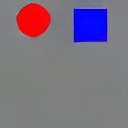

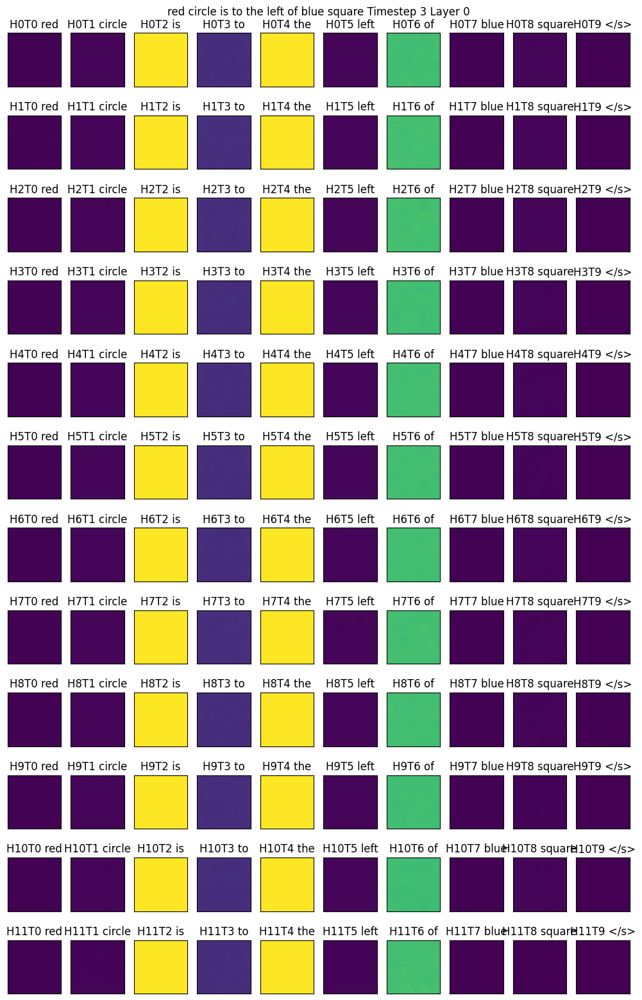

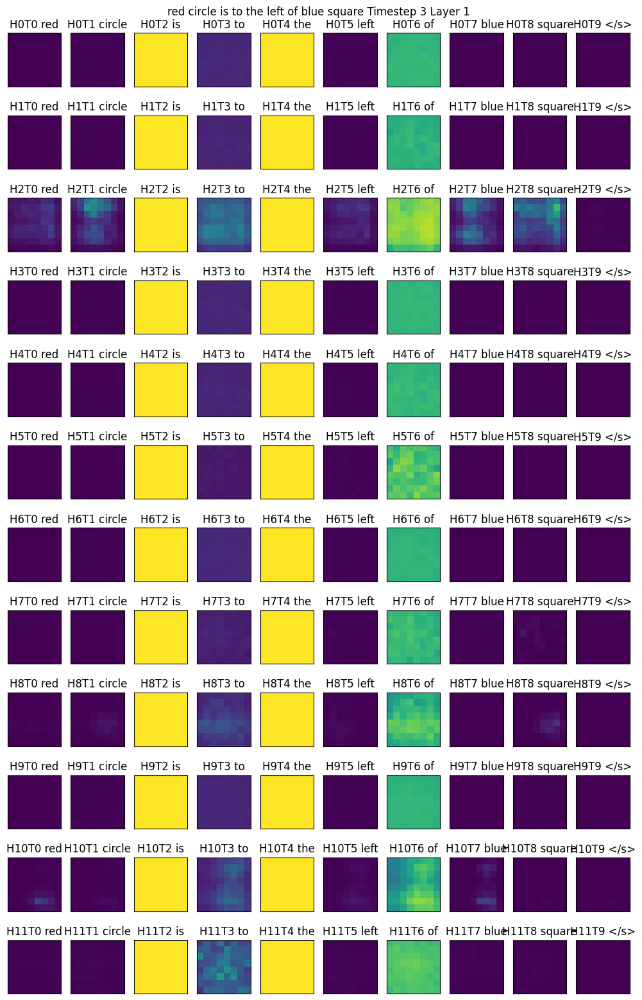

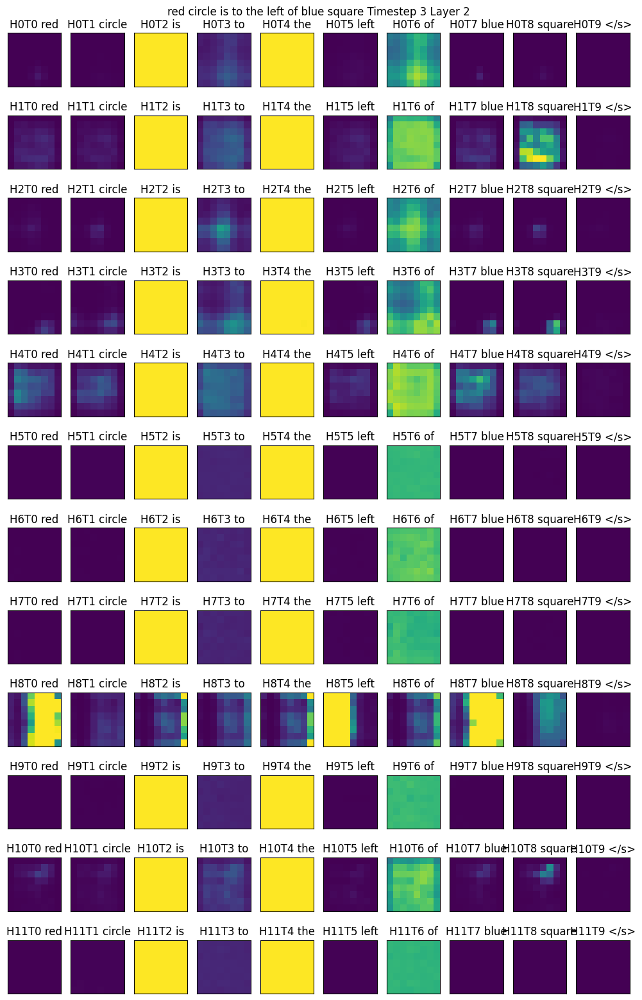

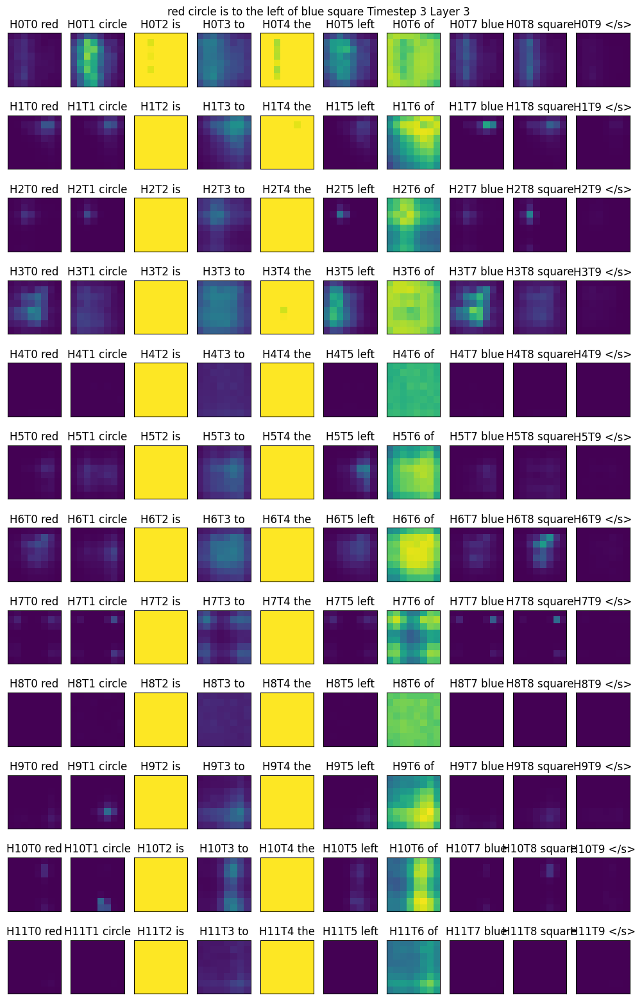

...

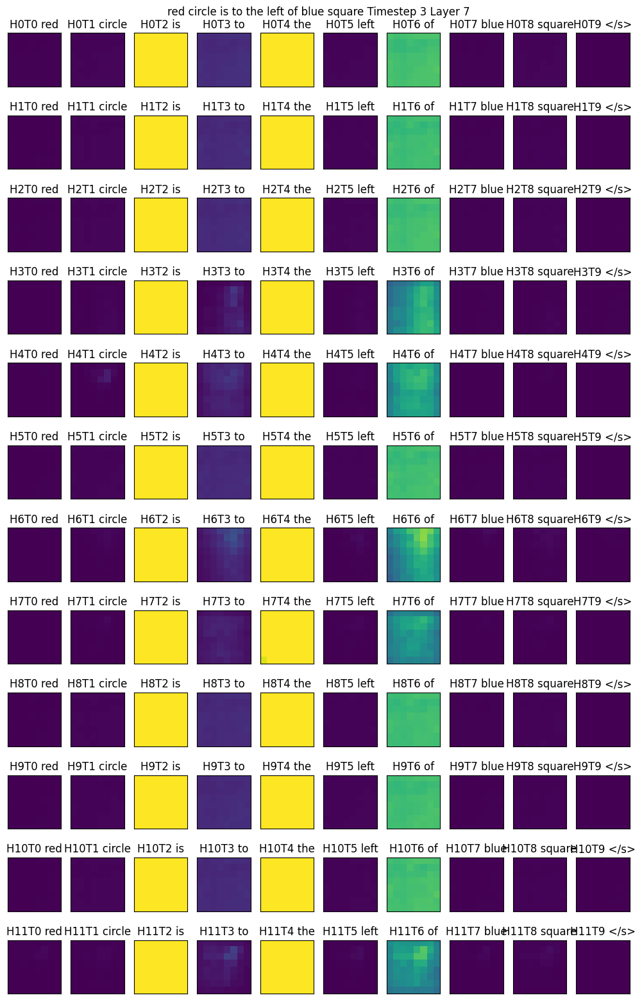

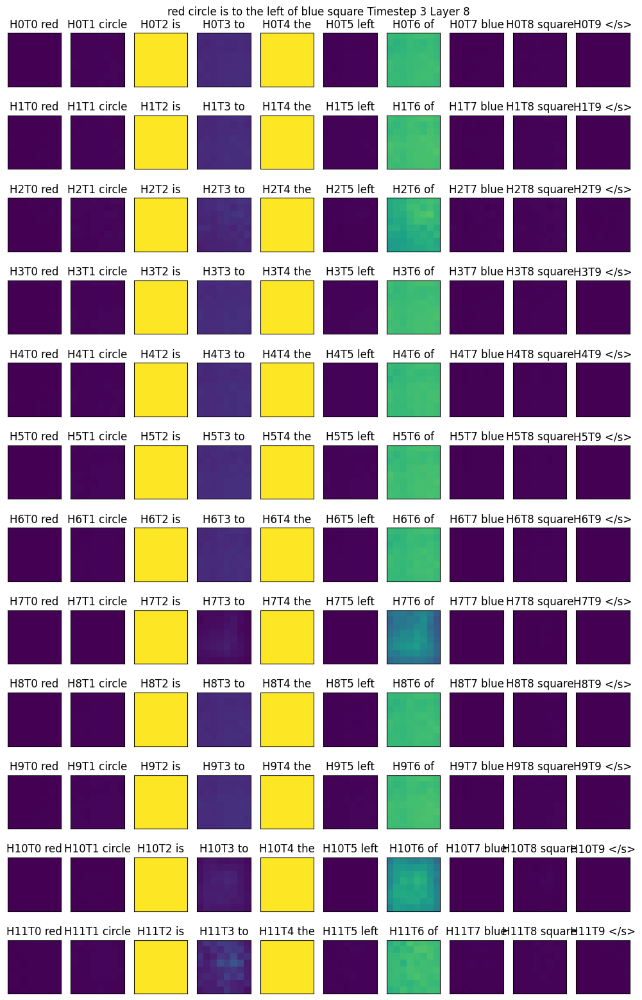

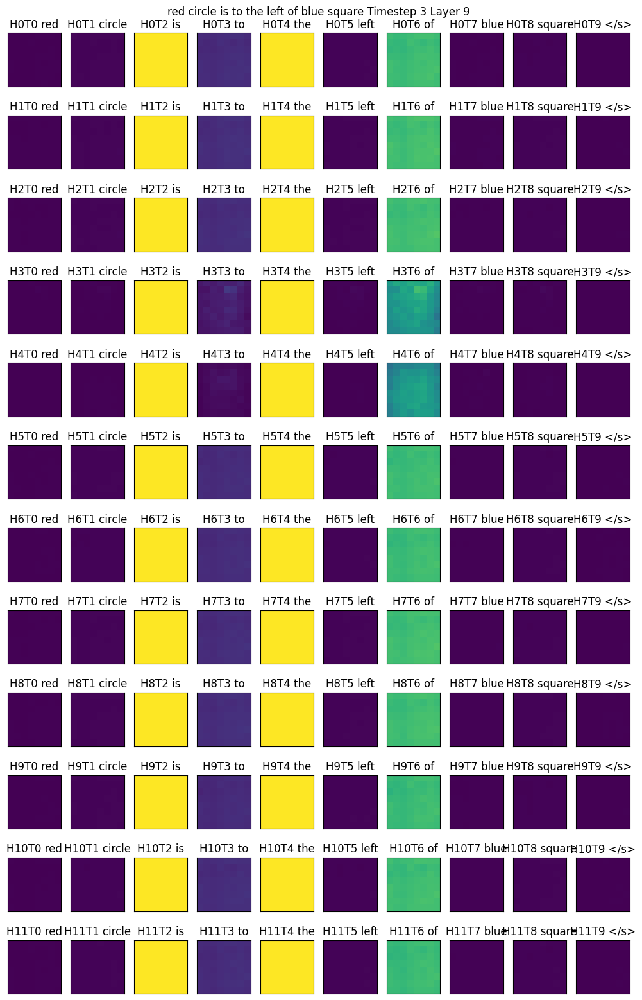

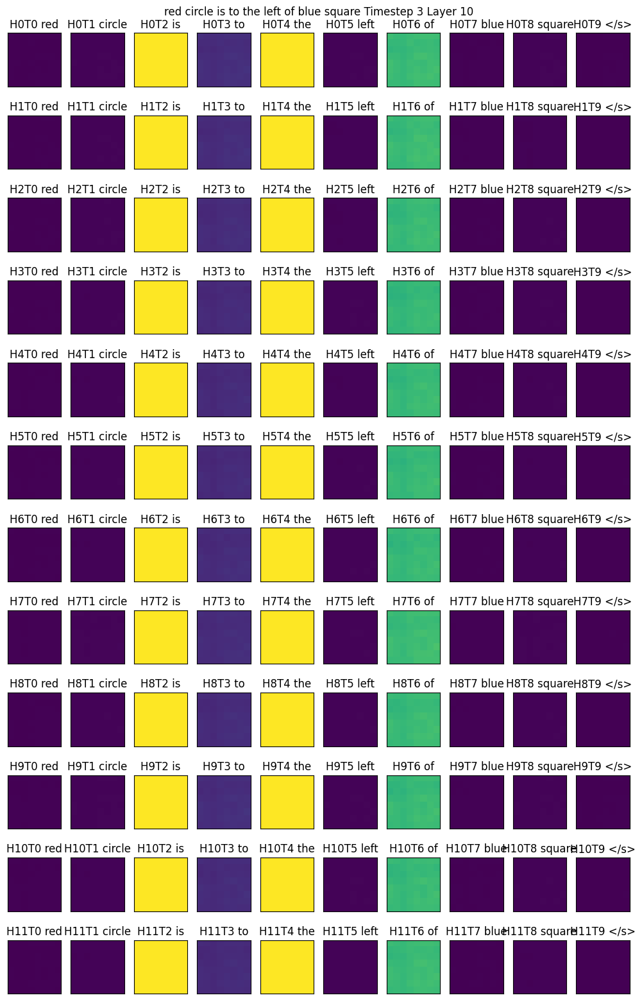

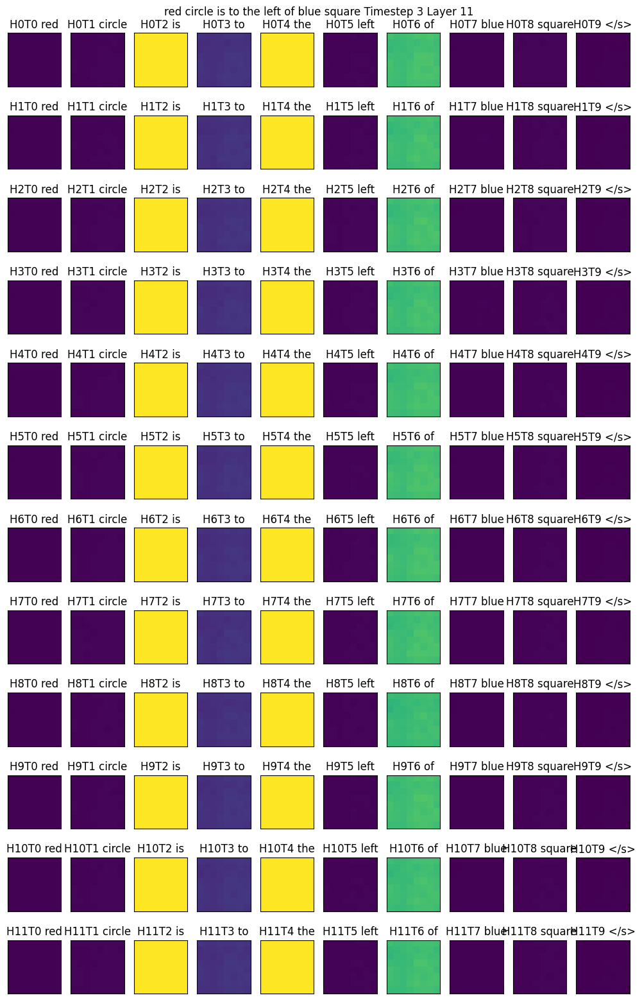

In [11]:
# layer_i = 6 # note the 
timestep = 3
sample_id = 1
display(image_logs_sel[0]['images'][sample_id])
for layer_i in range(12):
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
    
    # display(image_logs_sel[0]['images'][sample_id])
    figh, axs = plt.subplots(12, len(word_tokens), figsize=(10, 16))
    for head_id in range(12):
        for token_id in range(len(word_tokens)):
            ax = axs[head_id, token_id]
            ax.imshow(cross_attn_map[25 + sample_id, 
                                    head_id, :, 
                                    token_id].view(8, 8).cpu().numpy(), vmin=0, vmax=0.2)
            ax.axis('image')
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_title(f'H{head_id}T{token_id} {word_tokens[token_id]}')
            
    plt.suptitle(f'{prompt} Timestep {timestep} Layer {layer_i}')
    plt.tight_layout()


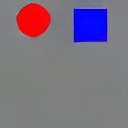

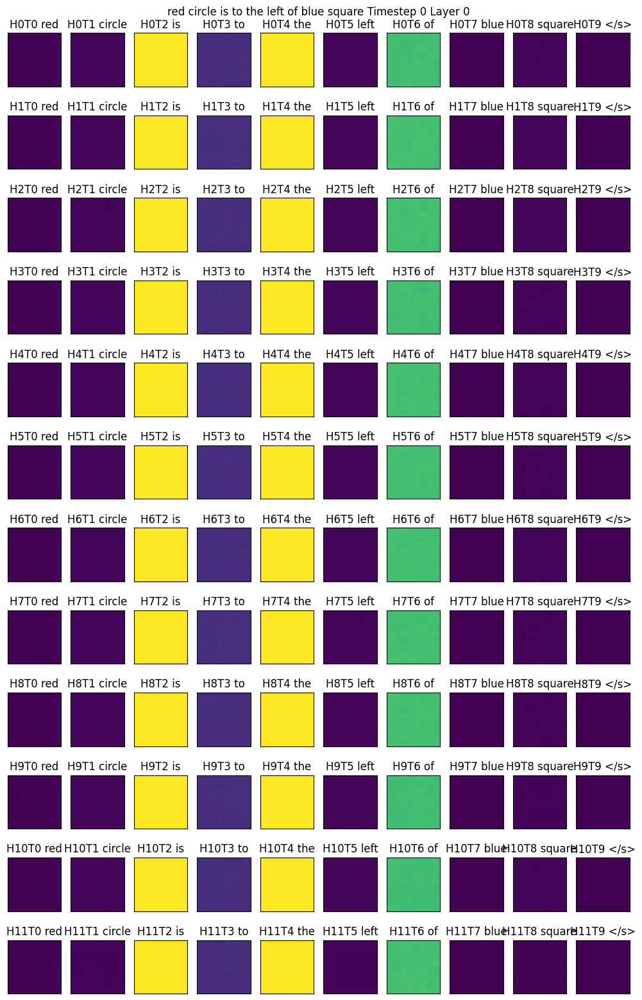

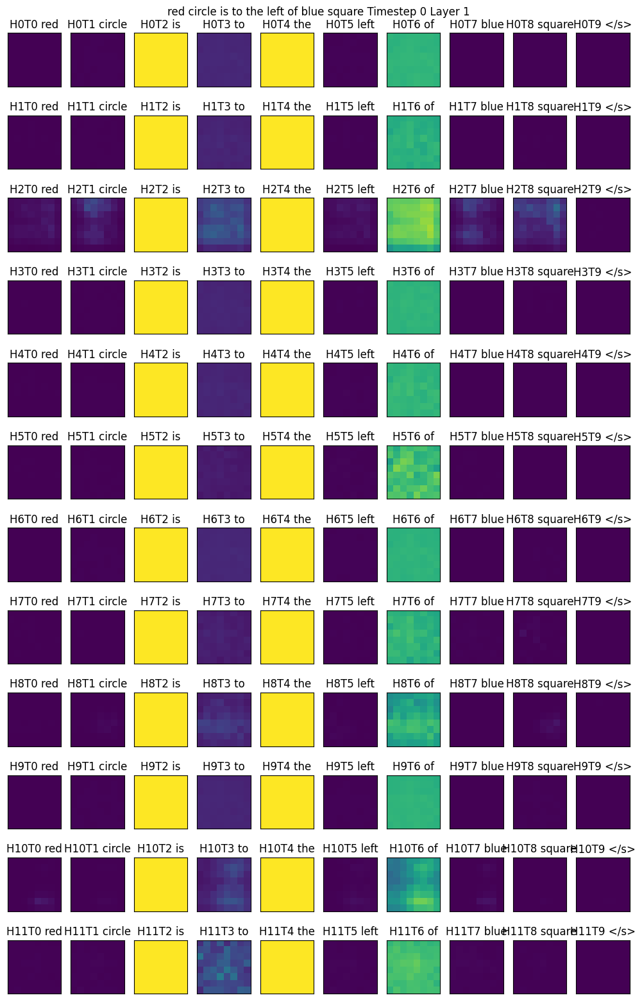

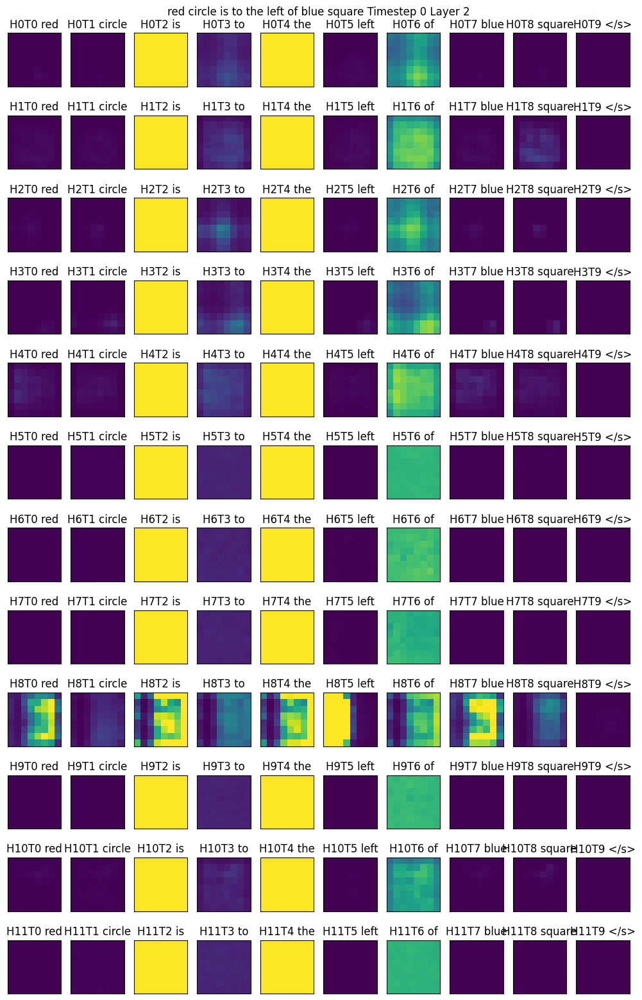

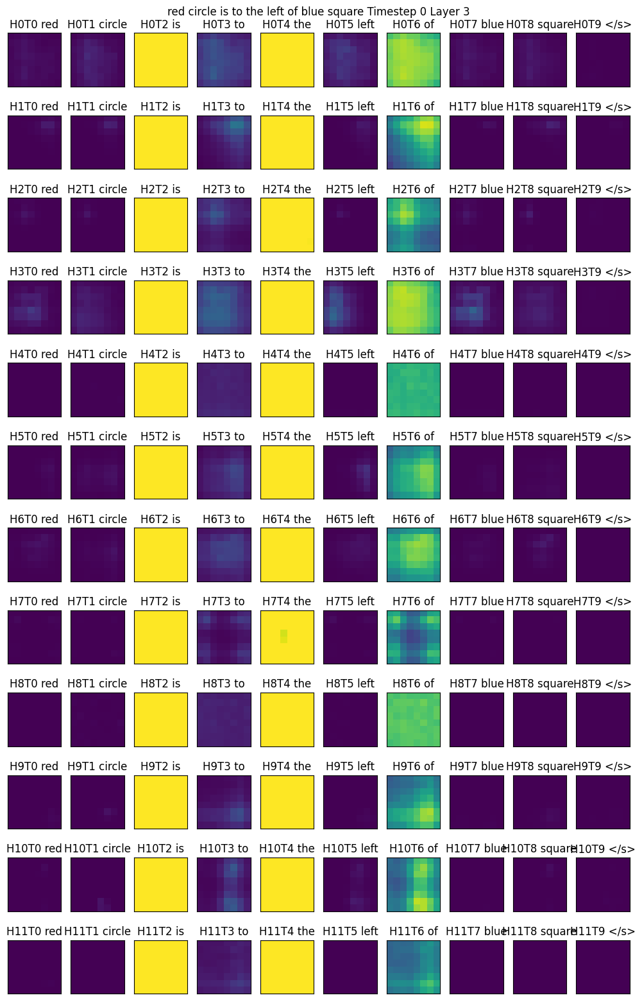

...

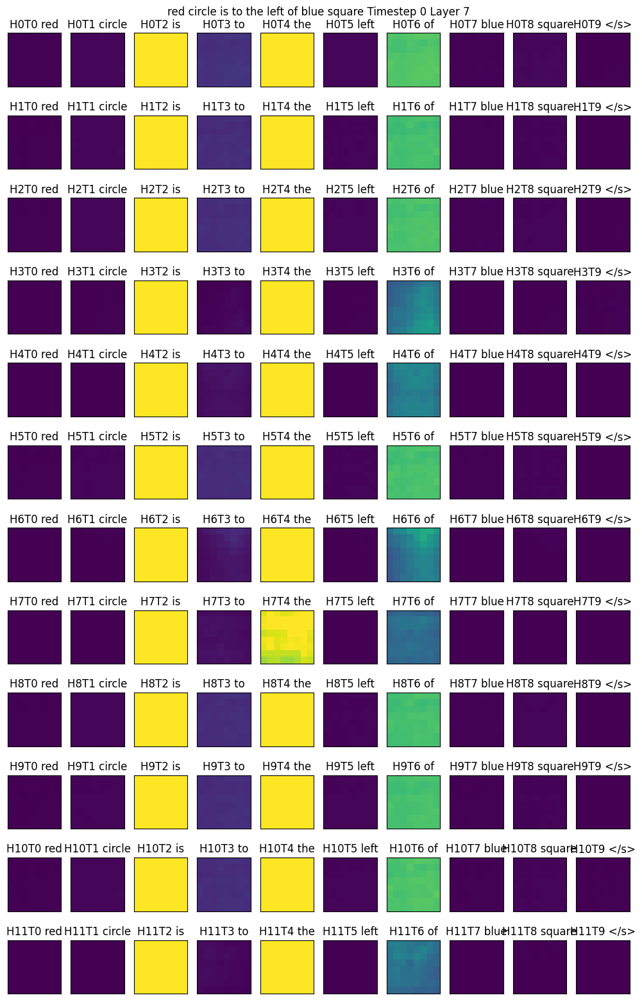

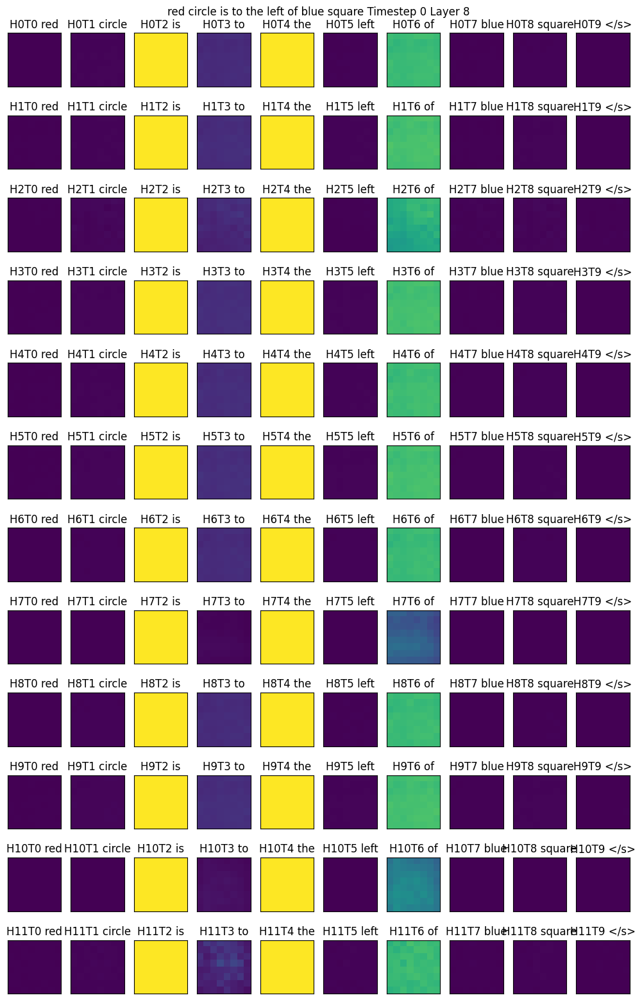

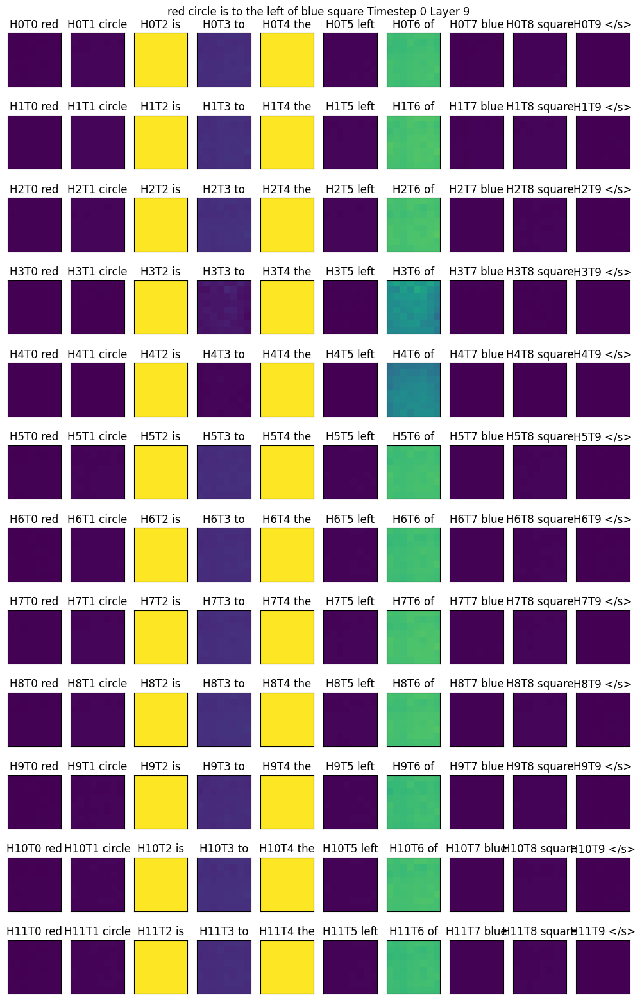

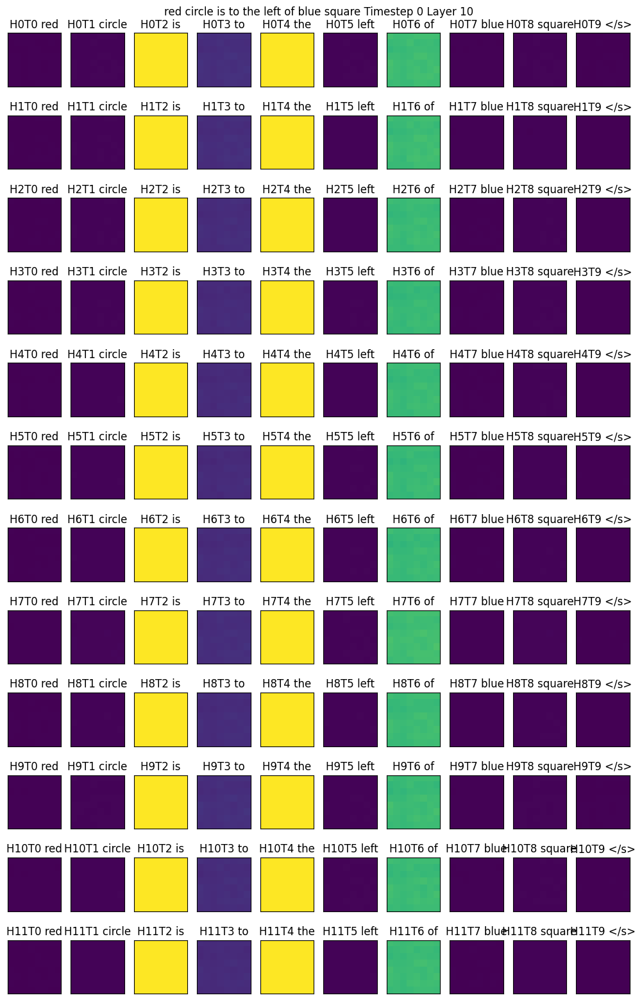

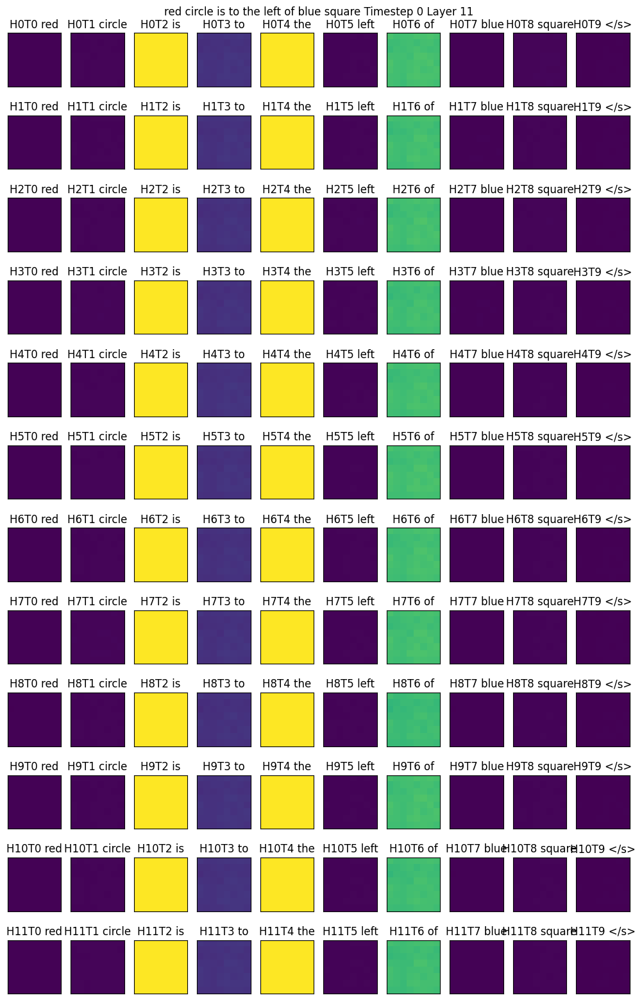

In [16]:
# layer_i = 6 # note the 
timestep = 0
sample_id = 1
display(image_logs_sel[0]['images'][sample_id])
for layer_i in range(12):
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
    
    # display(image_logs_sel[0]['images'][sample_id])
    figh, axs = plt.subplots(12, len(word_tokens), figsize=(10, 16))
    for head_id in range(12):
        for token_id in range(len(word_tokens)):
            ax = axs[head_id, token_id]
            ax.imshow(cross_attn_map[25 + sample_id, 
                                    head_id, :, 
                                    token_id].view(8, 8).cpu().numpy(), vmin=0, vmax=0.2)
            ax.axis('image')
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_title(f'H{head_id}T{token_id} {word_tokens[token_id]}')
            
    plt.suptitle(f'{prompt} Timestep {timestep} Layer {layer_i}')
    plt.tight_layout()


In [ ]:
# layer_i = 6 # note the 
timestep = 4
sample_id = 1
display(image_logs_sel[0]['images'][sample_id])
for layer_i in range(12):
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]-attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep-1]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]-attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep-1]
    
    # display(image_logs_sel[0]['images'][sample_id])
    figh, axs = plt.subplots(12, len(word_tokens), figsize=(10, 16))
    for head_id in range(12):
        for token_id in range(len(word_tokens)):
            ax = axs[head_id, token_id]
            ax.imshow(cross_attn_map[25 + sample_id, 
                                    head_id, :, 
                                    token_id].view(8, 8).cpu().numpy(), vmin=0, vmax=0.2)
            ax.axis('image')
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_title(f'H{head_id}T{token_id} {word_tokens[token_id]}')
            
    plt.suptitle(f'{prompt} Timestep delta {timestep} Layer {layer_i}')
    plt.tight_layout()


### movie

In [ ]:
import imageio.v3 as iio
from IPython.display import Video
import numpy as np

layer_i = 6  # note the 
timestep = 11
sample_id = 1
display(image_logs_sel[0]['images'][sample_id])

for layer_i in range(12):
    print(f"layer {layer_i}")
    images = []
    for timestep in range(1,14):
        print(f"timestep {timestep}")
        fig, axs = plt.subplots(12, len(word_tokens), figsize=(8, 10))
        
        for head_id in range(12):
            
            cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep] - attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep-1]
            for token_id in range(len(word_tokens)):
                
                ax = axs[head_id, token_id]
                ax.clear()  # Clear previous image
                img_data = cross_attn_map[25 + sample_id, head_id, :, token_id].view(8, 8).cpu().numpy()
                ax.imshow(img_data, vmin=-0.2, vmax=0.2, cmap='seismic')
                ax.axis('image')
                ax.set_xticks([])
                ax.set_yticks([])
                ax.set_xticklabels([])
                ax.set_yticklabels([])
                if head_id == 0:
                    ax.set_title(f'{word_tokens[token_id]}')
        plt.suptitle(f'{prompt} Timestep delta {timestep} Layer {layer_i}')
        plt.tight_layout()
        fig.canvas.draw()
        image = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
        image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))  # Changed to (4,) to include alpha channel
        images.append(image)
        # fig.clear()

    # Create a video from the images
    iio.imwrite(f"/n/sompolinsky_lab/Everyone/xupan/temp/{prompt}_{layer_i}.mp4", images, fps=4, quality=4)
    # play the video
Video(f"/n/sompolinsky_lab/Everyone/xupan/temp/{prompt}_{layer_i}.mp4")

In [ ]:
Video(f"/n/sompolinsky_lab/Everyone/xupan/temp/{prompt}_{layer_i}.mp4")

In [5]:
iio.imwrite(f"/n/sompolinsky_lab/Everyone/xupan/temp/{prompt}_{layer_i}.mp4", images, fps=4, quality=4)
    # play the video
Video(f"/n/sompolinsky_lab/Everyone/xupan/temp/{prompt}_{layer_i}.mp4")

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (800, 1000) to (800, 1008) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[rawvideo @ 0x7291080] Stream #0: not enough frames to estimate rate; consider increasing probesize


### Visualize cross attention matrix 

In [87]:
prompt_slice = slice(0, 1)
attnvis_store.clear_activation()
image_logs_sel, latents_traj_sel, pred_traj_sel, t_traj_sel = visualize_prompts_with_traj(\
    pipeline, validation_prompts[prompt_slice], prompt_cache_dir, config.model_max_length, weight_dtype, random_seed=0)

embed_infos = load_embed_and_mask(validation_prompts[prompt_slice], prompt_cache_dir, config.model_max_length, device="cuda")
print(embed_infos[0]['prompt'])
prompt = embed_infos[0]['prompt']
# attention_mask_raw = embed_infos[0]['emb_mask'].cpu()
token_ids = tokenizer.encode(prompt)
word_tokens = tokenizer.convert_ids_to_tokens(token_ids)
word_tokens = [token.replace("▁", "") for token in word_tokens]
print(word_tokens)

torch.Size([50, 20, 4096])
torch.Size([50, 20])
triangle is to the upper left of square
['triangle', 'is', 'to', 'the', 'upper', 'left', 'of', 'square', '</s>']


In [88]:
layer_i = 11 # note the 
timestep = 1
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
print(self_attn_map.shape, cross_attn_map.shape)

torch.Size([50, 12, 64, 64]) torch.Size([50, 12, 64, 20])


In [89]:
word_tokens

['triangle', 'is', 'to', 'the', 'upper', 'left', 'of', 'square', '</s>']

#### High attention to "meaningless" tokens

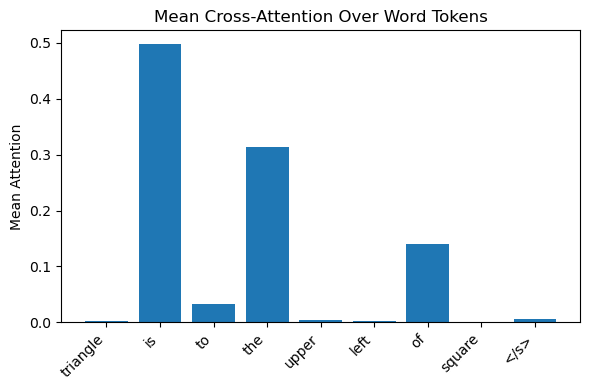

In [90]:

layer_i = 11 # note the 
timestep = 11
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]

plt.figure(figsize=(6, 4))
attn_means = cross_attn_map[25:, :, :, :].mean(dim=(0, 1, 2))
plt.bar(range(len(word_tokens)), attn_means[:len(word_tokens)])
plt.xticks(range(len(word_tokens)), word_tokens, rotation=45, ha='right')
plt.ylabel('Mean Attention')
plt.title('Mean Cross-Attention Over Word Tokens')
plt.tight_layout()
plt.show()

In [19]:
prompt_token_mask = embed_infos[0]['emb_mask'].cpu().squeeze(0).bool()
sample_id = 10
layer_i = 0 # note the 
timestep = 1
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
plt.figure(figsize=(15, 5))
for head_id in range(12): 
    plt.subplot(1, 12, head_id + 1)
    plt.imshow(cross_attn_map[25 + sample_id, head_id, :, prompt_token_mask].cpu().numpy())
    # plt.imshow(cross_attn_map[sample_id, head_id :, :].cpu().numpy())
    plt.colorbar()
    # plt.axis('off')
plt.tight_layout()
plt.show()

NameError: name 'embed_infos' is not defined

In [ ]:
layer_i = 6 # note the 
timestep = 11
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
sample_id = 15
display(image_logs_sel[0]['images'][sample_id])
figh, axs = plt.subplots(12, len(word_tokens), figsize=(10, 16))
for head_id in range(12):
    for token_id in range(len(word_tokens)):
        ax = axs[head_id, token_id]
        ax.imshow(cross_attn_map[25 + sample_id, 
                                 head_id, :, 
                                 token_id].view(8, 8).cpu().numpy())
        ax.axis('image')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_title(f'H{head_id}T{token_id} {word_tokens[token_id]}')
        
plt.suptitle(f'{prompt} Timestep {timestep} Layer {layer_i}')
plt.tight_layout()

In [ ]:
prompt_token_mask

tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

### Run diffusion with custom prompts

In [8]:
import sys
from os.path import join
import torch
import matplotlib.pyplot as plt
sys.path.append("/n/home13/xupan/sompolinsky_lab/DiffusionObjectRelation/PixArt-alpha")
from diffusion.utils.misc import read_config, set_random_seed, \
    init_random_seed, DebugUnderflowOverflow
sys.path.append("/n/home13/xupan/sompolinsky_lab/DiffusionObjectRelation")
from utils.pixart_sampling_utils import visualize_prompts, PixArtAlphaPipeline_custom, \
    load_embed_and_mask, visualize_prompts_with_traj
from utils.pixart_utils import construct_diffuser_pipeline_from_config, construct_pixart_transformer_from_config, state_dict_convert
from utils.attention_map_store_utils import replace_attn_processor, AttnProcessor2_0_Store, PixArtAttentionVisualizer_Store
from transformers import T5Tokenizer, T5EncoderModel
import os
import torch as th
from utils.image_utils import pil_images_to_grid
from utils.custom_text_encoding_utils import save_prompt_embeddings_randemb, RandomEmbeddingEncoder, RandomEmbeddingEncoder_wPosEmb

In [9]:
def tokenize_embed_prompt(prompt, tokenizer, text_encoder, max_length=20, device="cuda"):
    uncond = tokenizer("", max_length=max_length, padding="max_length", truncation=True, return_tensors="pt").to(device)
    uncond_prompt_embeds = text_encoder(uncond.input_ids, attention_mask=uncond.attention_mask)[0]
    uncond_result = {'caption_embeds': uncond_prompt_embeds, 'emb_mask': uncond.attention_mask, 'prompt': '', 'token_ids': uncond.input_ids}
    caption_token = tokenizer(prompt, max_length=max_length, padding="max_length", truncation=True, return_tensors="pt").to(device)
    caption_emb = text_encoder(caption_token.input_ids, attention_mask=caption_token.attention_mask)[0]
    cond_result = {'caption_embeds': caption_emb, 'emb_mask': caption_token.attention_mask, 'prompt': prompt, 'token_ids': caption_token.input_ids}
    return uncond_result, cond_result

In [10]:
@torch.inference_mode()
def visualize_prompts_with_traj_from_embed_dict(pipeline, uncond_prompt_dict, cond_prompt_dict, weight_dtype=torch.float16,
                   num_inference_steps=14, guidance_scale=4.5, num_images_per_prompt=25, device="cuda", random_seed=0):
    # logger.info("Running validation... ")
    # device = accelerator.device
    # model = accelerator.unwrap_model(model)
    pipeline = pipeline.to(device)
    pipeline.set_progress_bar_config(disable=True)
    if random_seed is None:
        generator = None
    else:
        generator = torch.Generator(device=device).manual_seed(random_seed)
    image_logs = []
    images = []
    latents = []
    pred_traj = []
    latents_traj = []
    t_traj = []
    visualized_prompts = []
    # uncond_data = torch.load(f'{prompt_cache_dir}/uncond_{max_length}token.pth', map_location='cpu')
    uncond_prompt_embeds = uncond_prompt_dict['caption_embeds'].to(device)
    uncond_prompt_attention_mask = uncond_prompt_dict['emb_mask'].to(device)
    # for _, prompt in enumerate(validation_prompts):
    caption_embs = cond_prompt_dict['caption_embeds'].to(device)
    emb_masks = cond_prompt_dict['emb_mask'].to(device)
    output = pipeline(
        num_inference_steps=num_inference_steps,
        num_images_per_prompt=num_images_per_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        prompt_embeds=caption_embs,
        prompt_attention_mask=emb_masks,
        negative_prompt=None,
        negative_prompt_embeds=uncond_prompt_embeds,
        negative_prompt_attention_mask=uncond_prompt_attention_mask,
        use_resolution_binning=False, # need this for smaller images like ours. 
        return_sample_pred_traj=True,
        output_type="latent",
    )
    latents.append(output[0].images)
    pred_traj.append(output[1])
    latents_traj.append(output[2])
    t_traj.append(output[3])
    visualized_prompts.append(prompt)
    # flush()
    for latent in latents:
        images.append(pipeline.vae.decode(latent.to(weight_dtype) / pipeline.vae.config.scaling_factor, return_dict=False)[0])
    for prompt, image in zip(visualized_prompts, images):
        image = pipeline.image_processor.postprocess(image, output_type="pil")
        image_logs.append({"validation_prompt": prompt, "images": image})
    
    return image_logs, latents_traj, pred_traj, t_traj

In [11]:
@torch.inference_mode()
def pipeline_inference_custom(pipeline, prompt, negative_prompt="", num_inference_steps=14, num_images_per_prompt=25, guidance_scale=4.5, random_seed=0, max_sequence_length=20, 
                              return_sample_pred_traj=True, output_type="latent", device="cuda", weight_dtype=torch.float16, **kwargs):
    pipeline = pipeline.to(device)
    output = pipeline(prompt=prompt,
         negative_prompt=negative_prompt,
         num_inference_steps=num_inference_steps,
         num_images_per_prompt=num_images_per_prompt,
         generator=torch.Generator(device=device).manual_seed(random_seed),
         guidance_scale=guidance_scale,
         max_sequence_length=max_sequence_length,
         use_resolution_binning=False,
         return_sample_pred_traj=return_sample_pred_traj,
         output_type=output_type,
         **kwargs,
    )
    if return_sample_pred_traj:
        latents = output[0].images
        pred_traj = output[1]
        latents_traj = output[2]
        t_traj = output[3]
    else:
        latents = output.images
        pred_traj = None
        latents_traj = None
        t_traj = None
    images = pipeline.vae.decode(latents.clone().to(weight_dtype) / pipeline.vae.config.scaling_factor, return_dict=False)[0]
    image_logs = []
    images = pipeline.image_processor.postprocess(images, output_type="pil")
    image_logs.append({"validation_prompt": prompt, "images": images})
    return image_logs, pred_traj, latents_traj, t_traj

In [14]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot"
ckptdir = join(savedir, "checkpoints")
config = read_config(join(savedir, 'config.py'))
weight_dtype = torch.float32
if config.mixed_precision == "fp16": # accelerator.
    weight_dtype = torch.float16
elif config.mixed_precision == "bf16": # accelerator.
    weight_dtype = torch.bfloat16
    
pipeline = construct_diffuser_pipeline_from_config(config, pipeline_class=PixArtAlphaPipeline_custom)
ckpt = torch.load(join(ckptdir, "epoch_4000_step_160000.pth"))
pipeline.transformer.load_state_dict(state_dict_convert(ckpt['state_dict_ema']))
pipeline = pipeline.to("cuda")
pipeline.set_progress_bar_config(disable=True)

validation_prompts = config.validation_prompts
prompt_cache_dir = config.prompt_cache_dir


text_feat_dir = '/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/objectRel_pilot_rndembposemb/caption_feature_wmask'
T5_path = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/output/pretrained_models/t5_ckpts/t5-v1_1-xxl"

tokenizer = T5Tokenizer.from_pretrained(T5_path)
rnd_encoding = th.load(join(text_feat_dir, "word_embedding_dict.pt"))
rndpos_encoder = RandomEmbeddingEncoder_wPosEmb(rnd_encoding["embedding_dict"], 
                                              rnd_encoding["input_ids2dict_ids"], 
                                              rnd_encoding["dict_ids2input_ids"], 
                                              max_seq_len=20, embed_dim=4096,
                                              wpe_scale=1/6).to("cuda")
pipeline.text_encoder = rndpos_encoder
pipeline.text_encoder.dtype = torch.float
pipeline.tokenizer = tokenizer

Loading pipeline components...: 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]


In [15]:
pipeline = pipeline.to("cuda")

In [16]:
pipeline.transformer = replace_attn_processor(pipeline.transformer)
attnvis_store = PixArtAttentionVisualizer_Store(pipeline)
attnvis_store.setup_hooks()

Setting up hooks for PixArt attention modules:
- Block 0
- Block 1
- Block 2
- Block 3
- Block 4
- Block 5
- Block 6
- Block 7
- Block 8
- Block 9
- Block 10
- Block 11


torch.Size([50, 20, 4096])
torch.Size([50, 20])


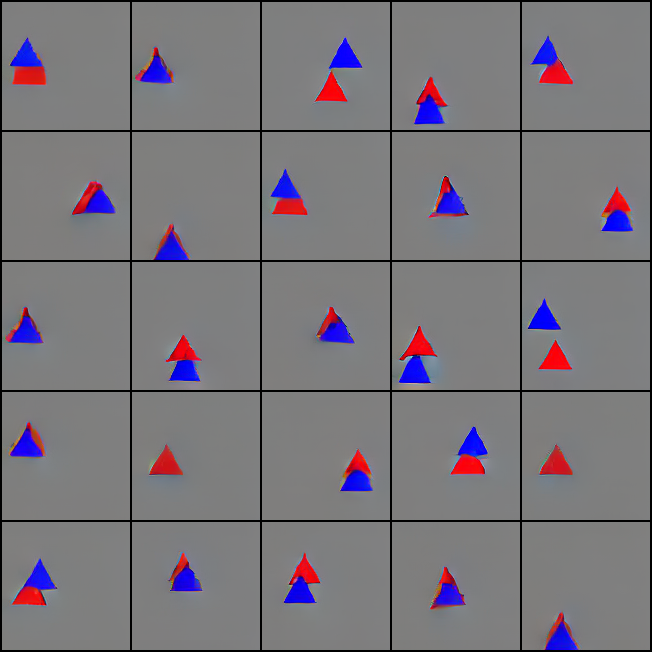

In [17]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "red blue triangle", return_sample_pred_traj=False, random_seed=0, device="cuda")
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


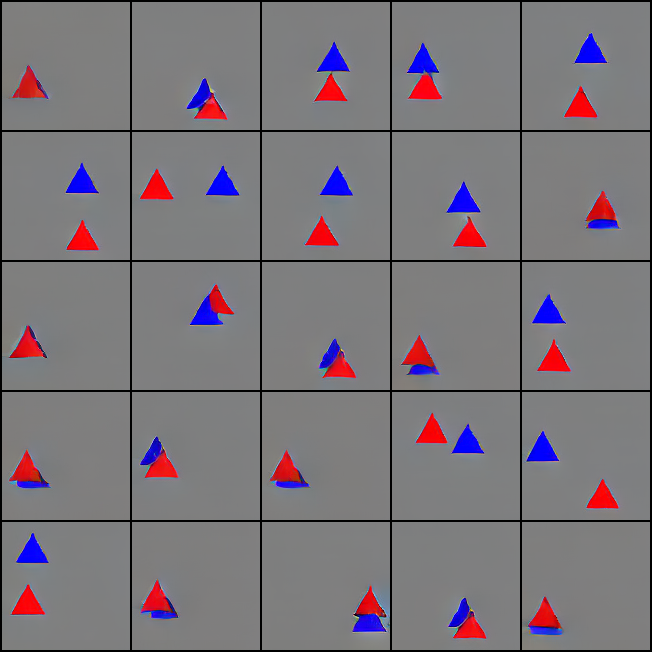

In [18]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "triangle blue red", return_sample_pred_traj=False, random_seed=0, device="cuda")
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


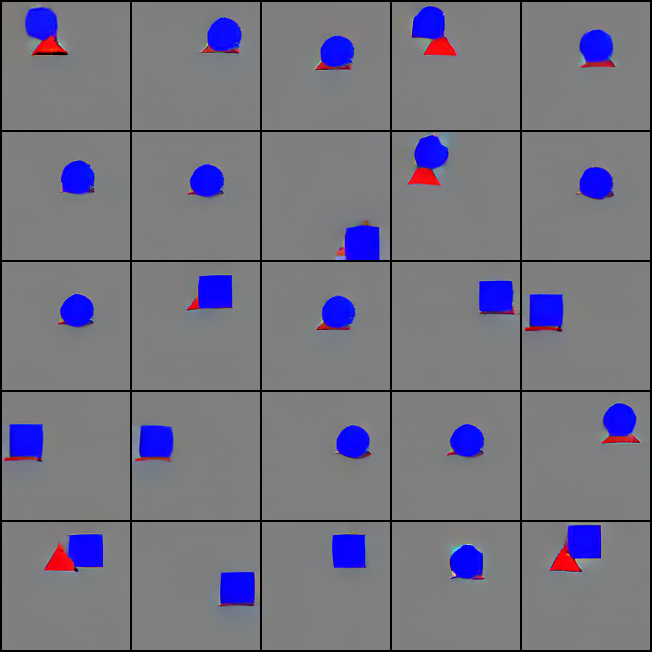

In [19]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "triangle red blue", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


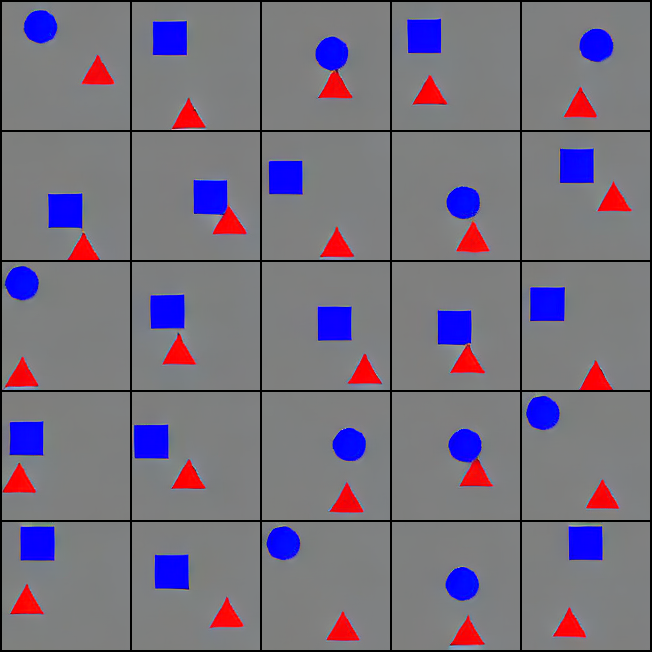

In [20]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "triangle red the the the the below ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


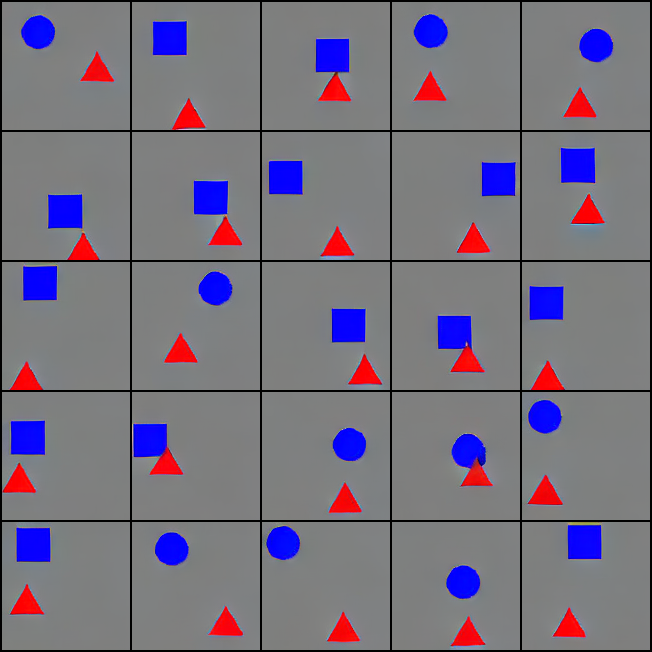

In [33]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "triangle red the the the the the the the the the the the the below ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


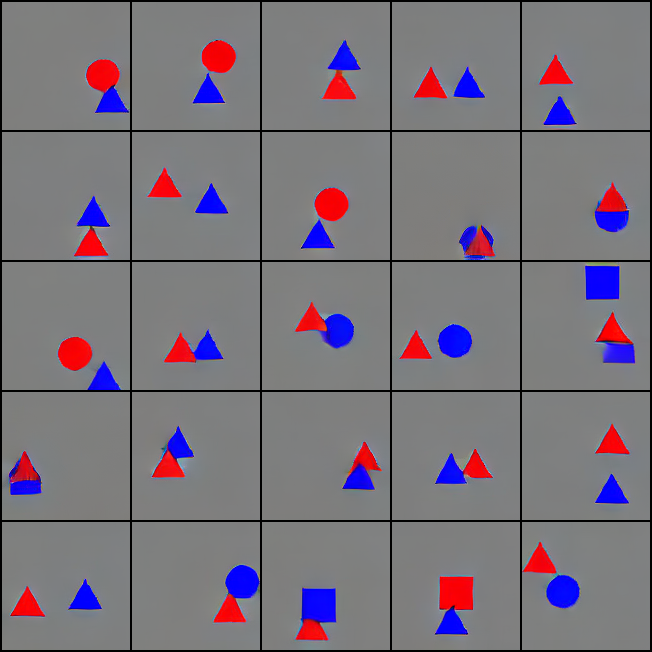

In [34]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "below triangle red the the the the the the the the the the the the", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


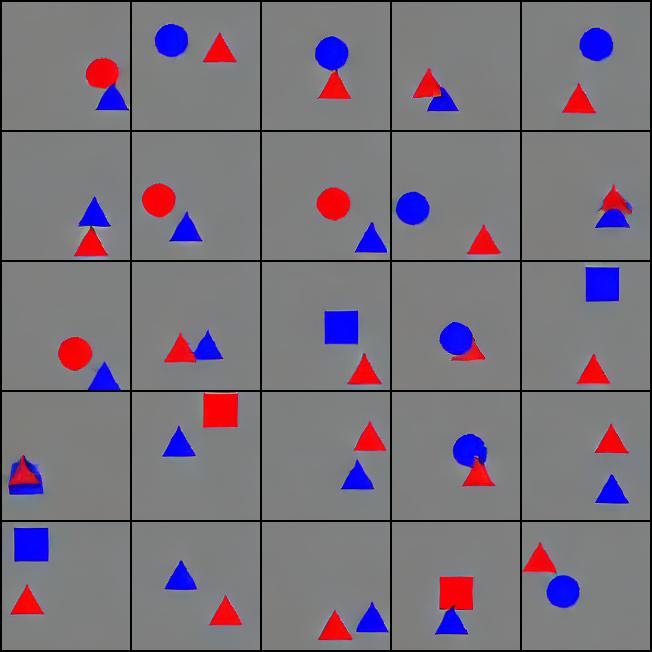

In [35]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "below triangle the the the the the the the the the the the the", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


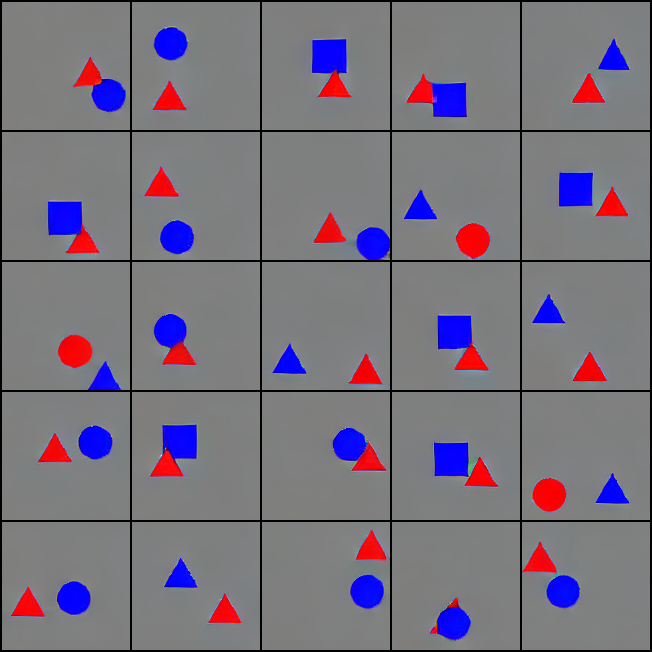

In [36]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "above triangle the the the the the the the the the the the the", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


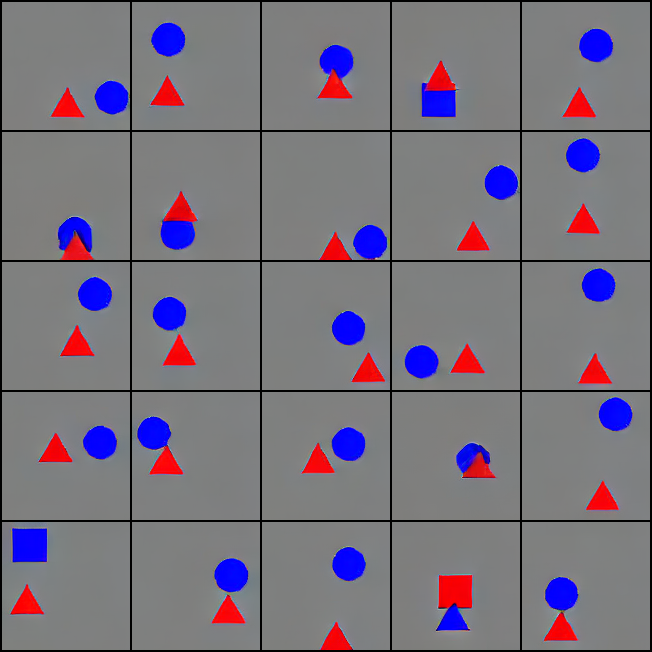

In [38]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "above the the the the triangle the the the the the the the the the the the", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


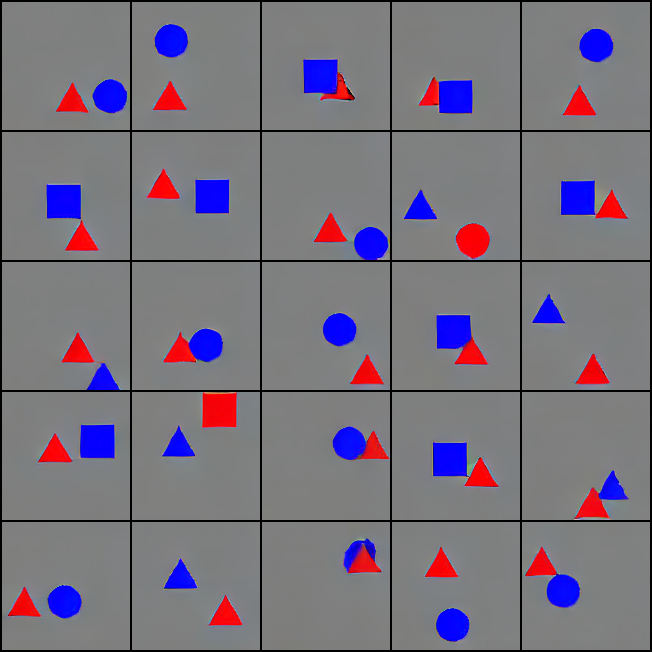

In [37]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "left triangle the the the the the the the the the the the the", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


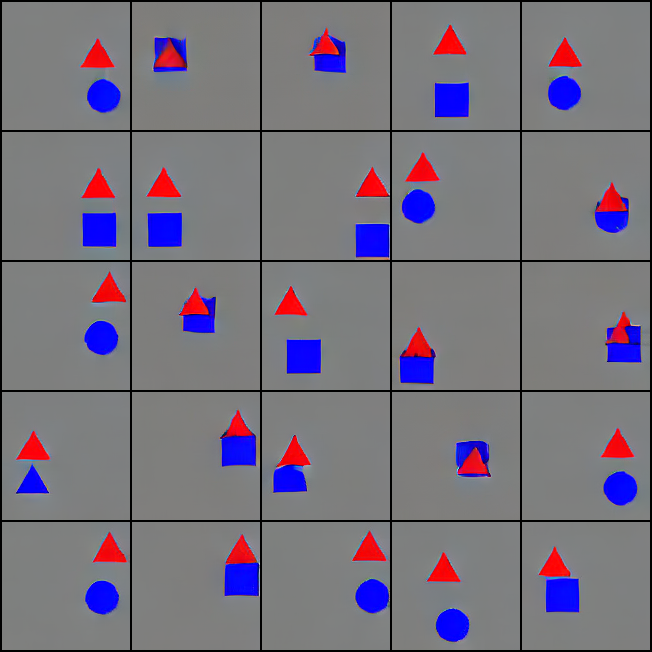

In [21]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "the the the the triangle red below ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


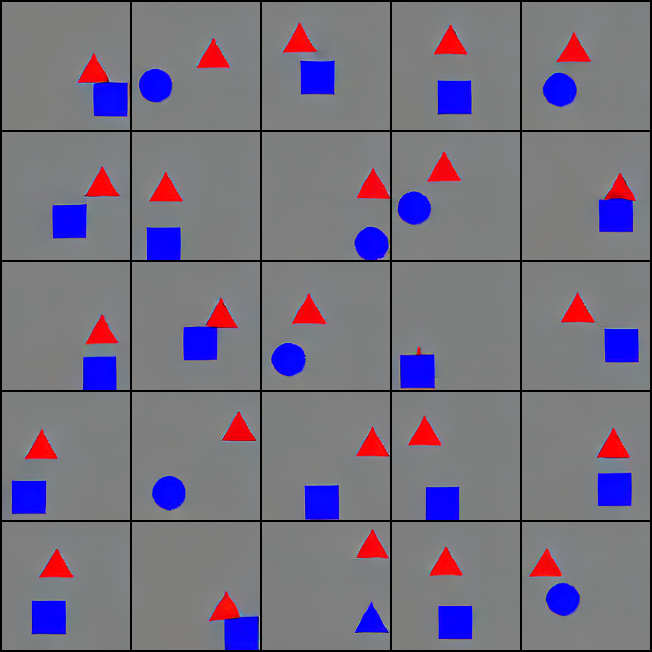

In [22]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "triangle red the the the the above ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


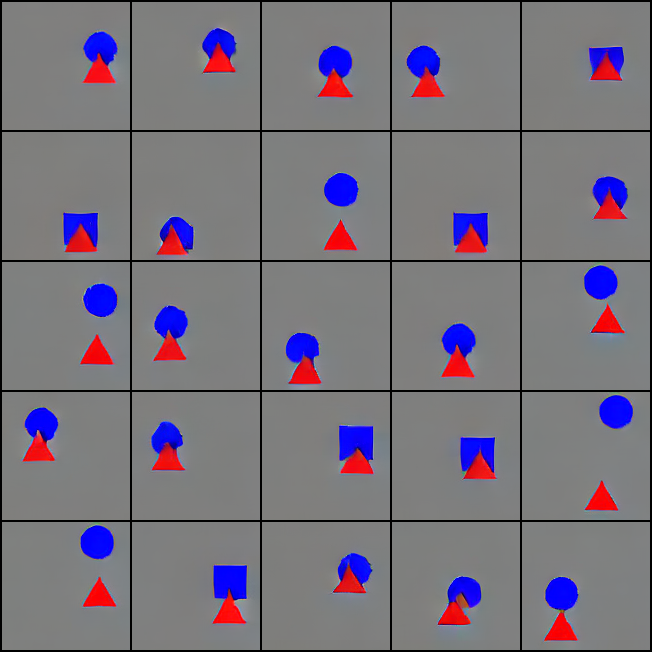

In [23]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "the the the the triangle red above ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


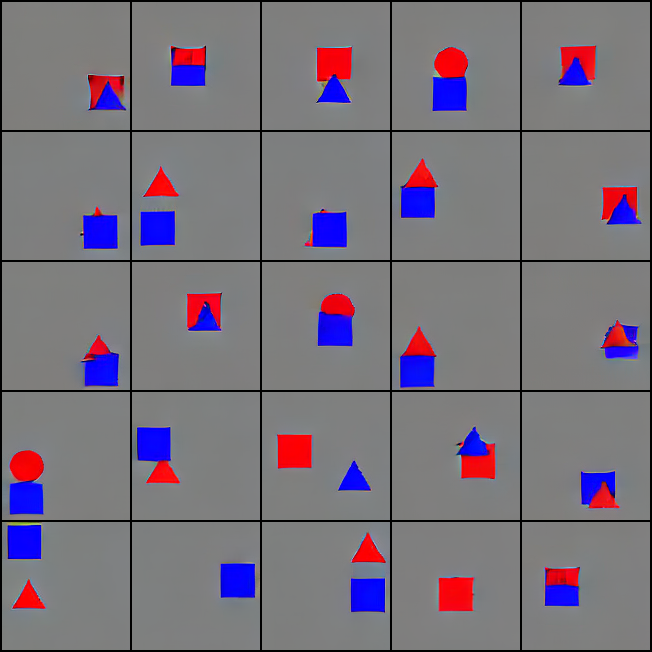

In [24]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "the the the triangle red square blue above ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


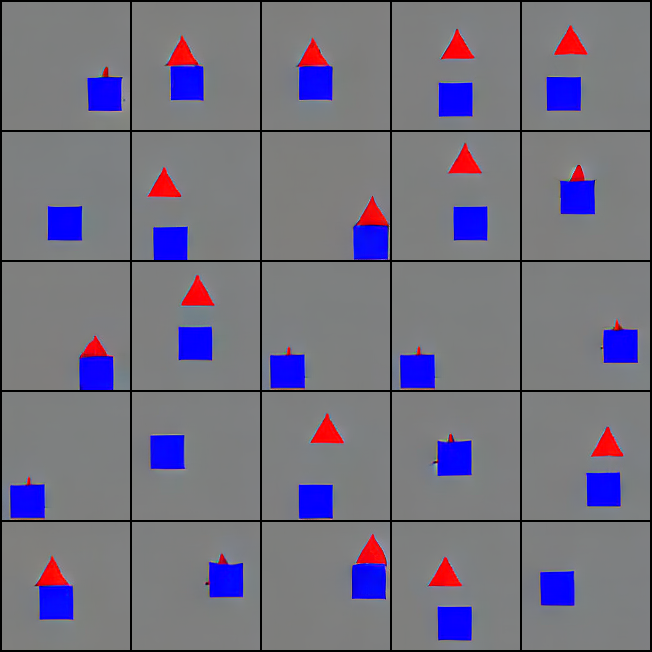

In [25]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "red triangle the the blue square above ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


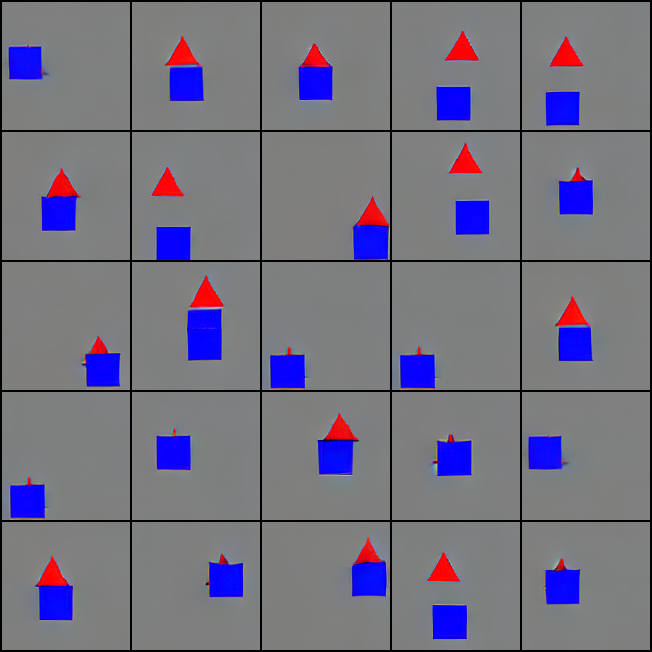

In [26]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "above red triangle is blue square", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

### Custom prompt attention

torch.Size([50, 20, 4096])
torch.Size([50, 20])


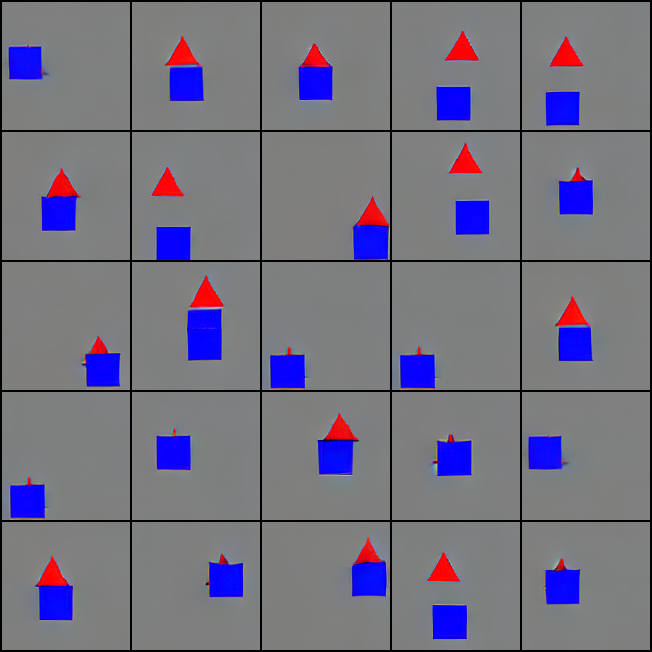

In [27]:
prompt = "above red triangle is blue square"
word_tokens = tokenizer.convert_ids_to_tokens(tokenizer.encode(prompt, ))
word_tokens = [token.replace("▁", "") for token in word_tokens]
attnvis_store.clear_activation()
images_logs, _, _, _ = pipeline_inference_custom(pipeline, prompt, return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

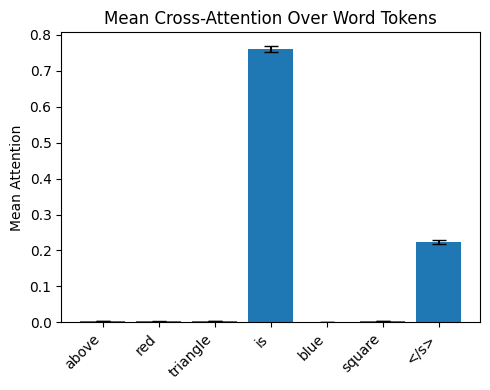

In [28]:
layer_i = 11 # note the 
timestep = 11
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]

plt.figure(figsize=(5, 4))
attn_means = cross_attn_map[25:, :, :, :].mean(dim=(0, 1, 2))
attn_std = cross_attn_map[25:, :, :, :].std(dim=(0, 1, 2))
plt.bar(range(len(word_tokens)), attn_means[:len(word_tokens)], yerr=attn_std[:len(word_tokens)], capsize=5)
plt.xticks(range(len(word_tokens)), word_tokens, rotation=45, ha='right')
plt.ylabel('Mean Attention')
plt.title('Mean Cross-Attention Over Word Tokens')
plt.tight_layout()
plt.show()

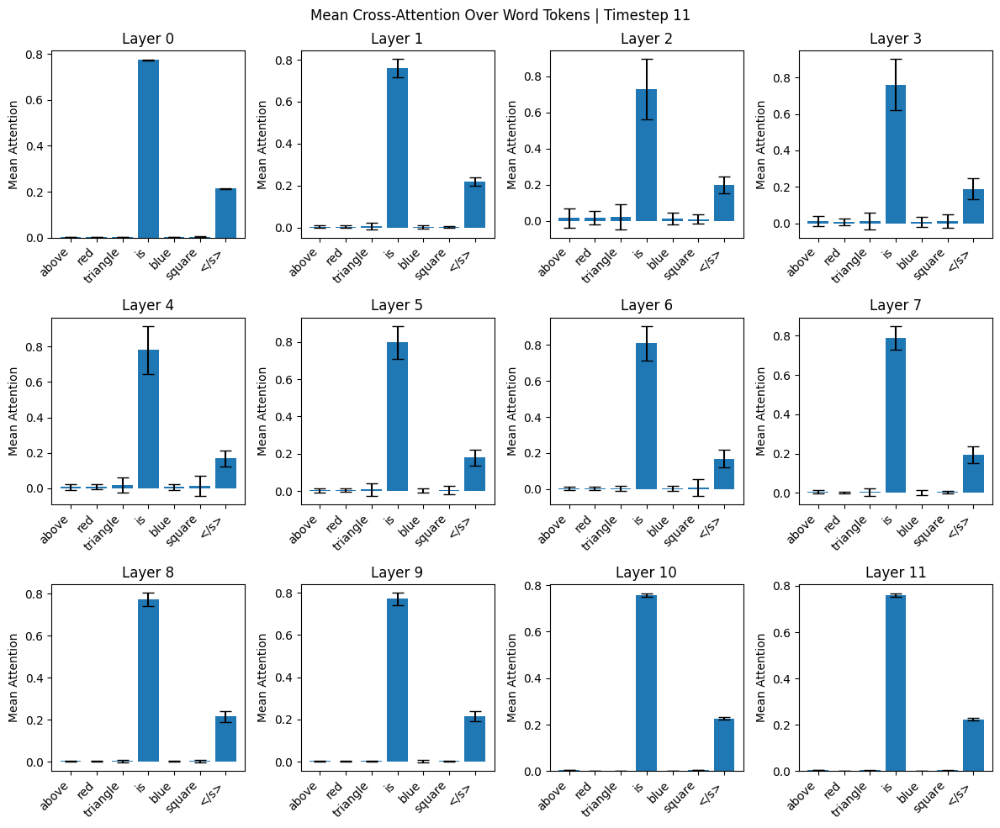

In [29]:
layer_i = 11 # note the 
timestep = 11
plt.figure(figsize=(12, 10))
for layer_i in range(12):
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
    attn_means = cross_attn_map[25:, :, :, :].mean(dim=(0, 1, 2))
    attn_std = cross_attn_map[25:, :, :, :].std(dim=(0, 1, 2))
    plt.subplot(3, 4, layer_i + 1)
    plt.bar(range(len(word_tokens)), attn_means[:len(word_tokens)], yerr=attn_std[:len(word_tokens)], capsize=5)
    plt.xticks(range(len(word_tokens)), word_tokens, rotation=45, ha='right')
    plt.ylabel('Mean Attention')
    plt.title(f'Layer {layer_i}')
plt.suptitle(f'Mean Cross-Attention Over Word Tokens | Timestep {timestep}')
plt.tight_layout()
plt.show()

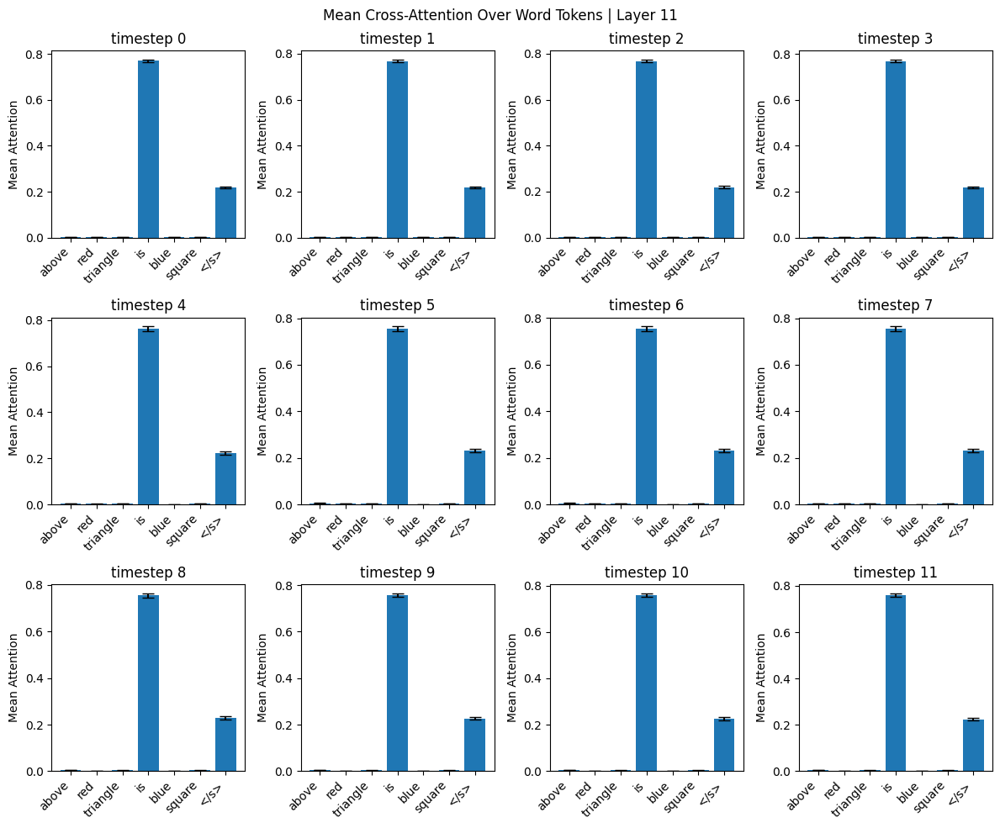

In [30]:
layer_i = 11 # note the 
timestep = 11
plt.figure(figsize=(12, 10))
for timestep in range(12):
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
    attn_means = cross_attn_map[25:, :, :, :].mean(dim=(0, 1, 2))
    attn_std = cross_attn_map[25:, :, :, :].std(dim=(0, 1, 2))
    plt.subplot(3, 4, timestep + 1)
    plt.bar(range(len(word_tokens)), attn_means[:len(word_tokens)], yerr=attn_std[:len(word_tokens)], capsize=5)
    plt.xticks(range(len(word_tokens)), word_tokens, rotation=45, ha='right')
    plt.ylabel('Mean Attention')
    plt.title(f'timestep {timestep}')
plt.suptitle(f'Mean Cross-Attention Over Word Tokens | Layer {layer_i}')
plt.tight_layout()
plt.show()

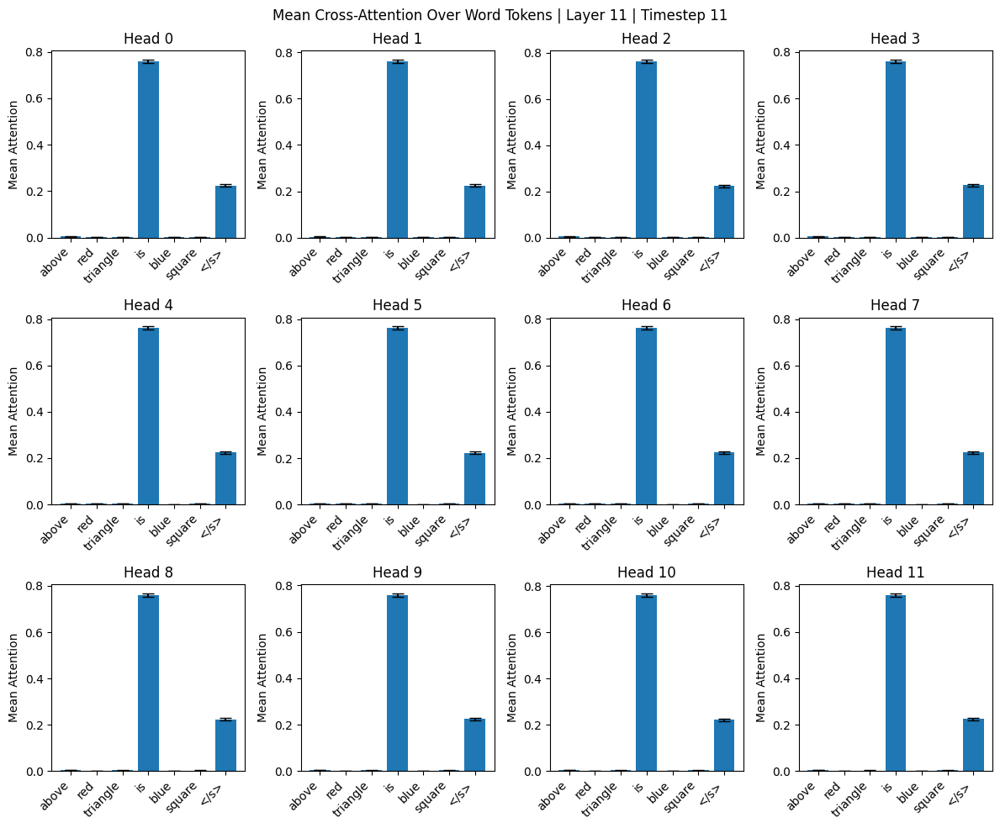

In [31]:
layer_i = 11 # note the 
timestep = 11
plt.figure(figsize=(12, 10))
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
for head_id in range(12):
    attn_means = cross_attn_map[25:, head_id, :, :].mean(dim=(0, 1))
    attn_std = cross_attn_map[25:, head_id, :, :].std(dim=(0, 1))
    plt.subplot(3, 4, head_id + 1)
    plt.bar(range(len(word_tokens)), attn_means[:len(word_tokens)], yerr=attn_std[:len(word_tokens)], capsize=5)
    plt.xticks(range(len(word_tokens)), word_tokens, rotation=45, ha='right')
    plt.ylabel('Mean Attention')
    plt.title(f'Head {head_id}')
plt.suptitle(f'Mean Cross-Attention Over Word Tokens | Layer {layer_i} | Timestep {timestep}')
plt.tight_layout()
plt.show()

### Scratch

In [32]:
tokenize_embed_prompt("red square blue triangle", tokenizer, rndpos_encoder, max_length=20, device="cuda")

({'caption_embeds': tensor([[[-0.0609,  0.3837,  0.2152,  ...,  0.2301,  0.0813,  0.3842],
           [ 0.3661,  0.2643,  0.2454,  ...,  0.1502,  0.1104,  0.1653],
           [ 0.3774,  0.1049,  0.2577,  ...,  0.1502,  0.1104,  0.1653],
           ...,
           [ 0.0656,  0.1284, -0.0507,  ...,  0.1502,  0.1106,  0.1653],
           [ 0.1006,  0.2843, -0.0281,  ...,  0.1502,  0.1106,  0.1653],
           [ 0.2508,  0.3391,  0.1164,  ...,  0.1502,  0.1107,  0.1653]]],
         device='cuda:0'),
  'emb_mask': tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]],
         device='cuda:0'),
  'prompt': '',
  'token_ids': tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]],
         device='cuda:0')},
 {'caption_embeds': tensor([[[ 0.1041,  0.4146, -0.2654,  ...,  0.0858, -0.0207,  0.1217],
           [ 0.0526,  0.0232,  0.4155,  ...,  0.1324, -0.0274,  0.1598],
           [ 0.1298, -0.1163,  0.2091,  ...,  0.0530, -0.2467,  0.2743],
           ...,
    